# Machine Learning — Assignment 1 — Iterative Optimization and Linear Regression

University of Granada (UGR), 2022–23  
Author: **Juan Pablo Escudero Ramírez**

Gradient descent, pseudoinverse, PLA, and linear models on handwritten digit features (digits 1 vs 5).

---


## <font color='blue'>Exercise 1: ITERATIVE SEARCH FOR OPTIMUMS (6.5 points)</font>


### <font color='blue'>(1.5 points) Implementation of Gradient Descent.</font>


In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


In [ ]:
# Environment: works locally (GitHub/Jupyter) and on Google Colab
import sys
from pathlib import Path

from paths import ROOT, get_data
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

print(f"Project root: {ROOT}")


#### <font color='blue'>(a) Implement the gradient descent algorithm and verify its correct operation with a convex function. </font>


##### Funciones auxiliares


In [2]:
'''This function shows a 3D figure with the function to be optimized along with the 
optimal found and the path followed during optimization.
    rng_val: range of values to sample in np.linspace()
    fun: function to optimize and display
    ws: set of weights (pairs of values [x,y] that the optimizer goes through
                           in its iterative search towards the optimum)
    views: viewing angle from which the function will be displayed in 3D
    colormap: color map used in visualization
    title_fig: top title of the figure
    
Usage example: display_figure(2, E, ws, [45,30], 'plasma','Gradient Descent')'''

def display_figure(rng_val, fun, ws, views, colormap, title_fig):
    x = np.linspace(-rng_val, rng_val, 50)
    y = np.linspace(-rng_val, rng_val, 50)
    X, Y = np.meshgrid(x, y)
    Z = fun(np.array([X, Y]))
    fig = plt.figure(figsize=(25, 15))
    ax = Axes3D(fig,auto_add_to_figure=False) 
    fig.add_axes(ax) 
    ax.plot_surface(X, Y, Z, edgecolor='none', rstride=1,
                            cstride=1, cmap=colormap, alpha=.6)
    if len(ws)>0:
        ws = np.asarray(ws)
        min_point = np.array([ws[-1,0],ws[-1,1]])
        min_point_ = min_point[:, np.newaxis]
        ax.plot(ws[:,0], ws[:,1], fun(ws.transpose()), 'r*', markersize=5)
        ax.plot(min_point_[0], min_point_[1], fun(min_point_), 'r*', markersize=10)
    if len(title_fig)>0:
        fig.suptitle(title_fig, fontsize=16)
    ax.set_xlabel('u')
    ax.set_ylabel('v')
    ax.set_zlabel('E(u,v)')
    ax.view_init(azim=views[0], elev=views[1])
    plt.show()


##### Explanation


The gradient descent algorithm
allows you to automatically determine the minimum of a mathematical function.

The algorithm advances through iterations in search of the local optimum, but it needs
some initial data that are an initial value (initial w) and the function to be minimized.


The general equation of the algorithm is: $Wj = Wj - (η * {\frac{∂E(W)}{∂Wj}}$ ) 

The meaning of its components is:

* ${\frac{∂E(W)}{∂Wj}}$ is the gradient of the function.
* η is the learning rate, which affects the descent speed of the algorithm
* Wj is the value obtained, it is updated simultaneously for all values of j ∈ N.


##### Implementation


For the implementation of the algorithm, an initial point obtained by argument is used. This is put into ws, which is a vector that stores all the ws in order to obtain the positions of the weights in each iteration.

It enters a loop that only stops if the value of the function becomes less than a fixed *epsilon* or all possible iterations are gone through. Within this loop the weights (W) are updated using the previously mentioned equation.


In [3]:
'''This function takes as input:
- w_ini: starting point
- lr: learning rate
- grad_fun: gradient function with which to operate
- fun: function that you want to minimize
- epsilon: threshold that allows, if fun(w) >= epsilon, to stop the algorithm
- max_iters: maximum number of iterations that allows, if that value is reached, to stop the algorithm
- show_evol: flag that, if True, shows the evolution of the weights, the gradient and the value of the function. Useful for code debugging. 

And provides as output: 
- w: minimum found
- it: iteration in which it was found
- ws: list with all the points traveled during the trajectory. Note that ws[-1]==w'''
def gd(w_ini, lr, grad_fun, fun, epsilon, max_iters = 100000, show_evol = False):
    it = 0
    w = w_ini.copy()
    ws = []
    ws.append(w)
    if show_evol:
      print('w_ini = ', w)
      print(fun(w))
      print(grad_fun(w))
    # Stopping criterion: number of iterations and
    # f value less than epsilon
    while (it < max_iters and fun(w) > epsilon):
        
        ws.append( w )
        w =  w - ( lr * grad_fun(w) ) 
        it += 1

        if show_evol:
          print('w_{} = {}'.format(it,w))
          print(fun(w))
          print(grad_fun(w))

    ws.append( w )
    return w, it, ws
    


#####<font color='blue'>Verify the correct functioning of the code implemented with the convex function $E(u,v)=u^2+v^2$, whose minimum is at the point $(0.0,0.0)$. Starting point: $(-4.0, 4.0)$, $\textit{learning rate}$ ($\eta$) of $0.01$, $100.000$ as maximum number of iterations, and $\epsilon = 1e-50$.</font>


###### Mathematical functions


Here the $E(u,v)=u^2+v^2$ function is implemented

The partial derivatives of the function must also be obtained.

* $\frac{\partial E(u,v)}{\partial u}=u*2$
* $\frac{\partial E(u,v)}{\partial v}=v*2$

After this they join together, thus forming the gradient.


In [4]:
def E(w):
  u = w[0]
  v = w[1]
  return u**2.0 + v**2.0

# Partial derivative of E with respect to u
def E_u(w):
  u = w[0]
  v = w[1]
  return u*2

# Partial derivative of E with respect to v
def E_v(w):
  u = w[0]
  v = w[1]
  return v*2
    
# Gradient of E
def gradE(w):
    return np.array([E_u(w), E_v(w)])



###### Execution


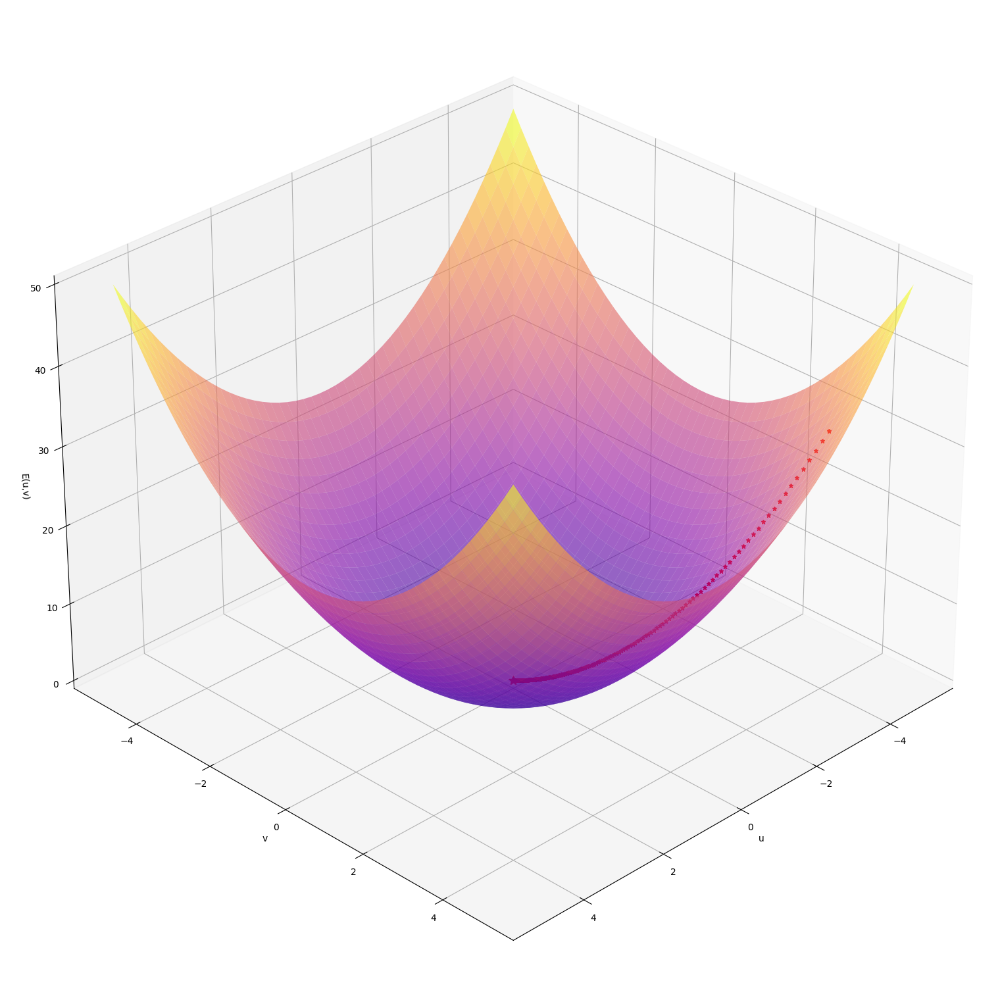

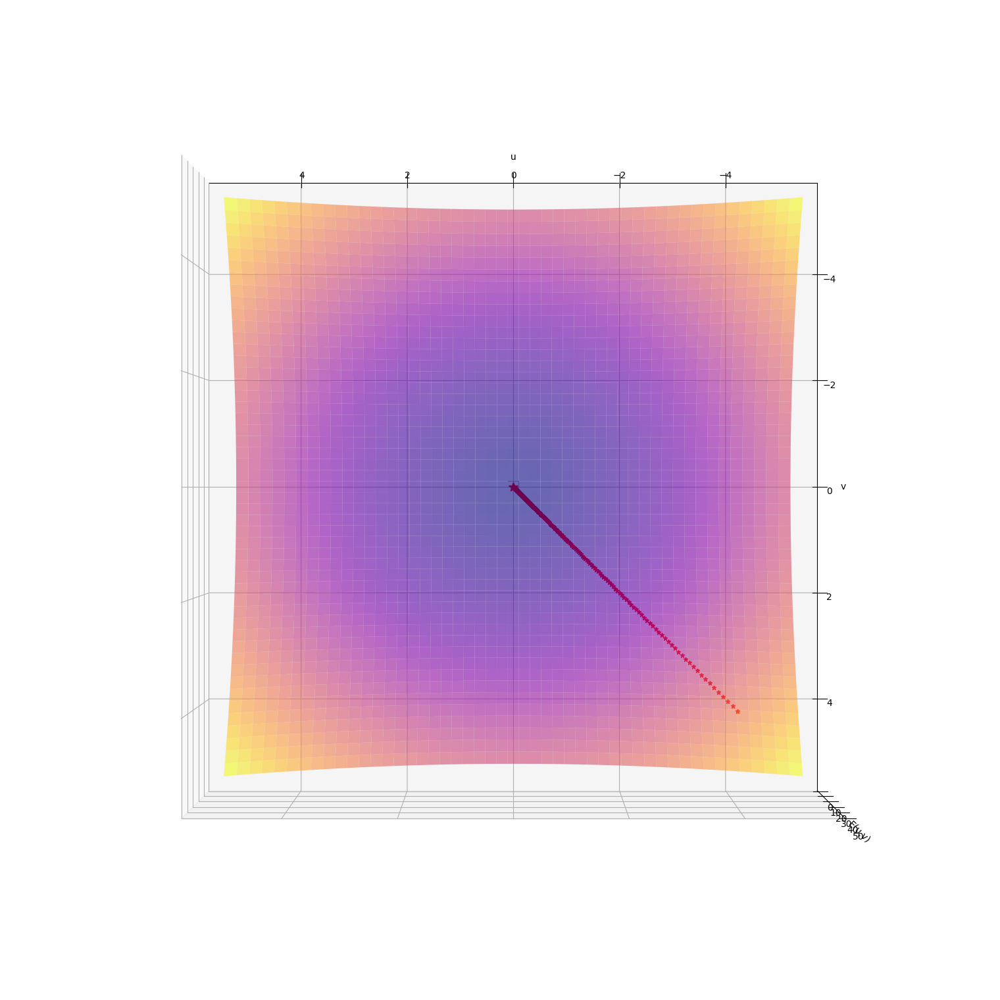

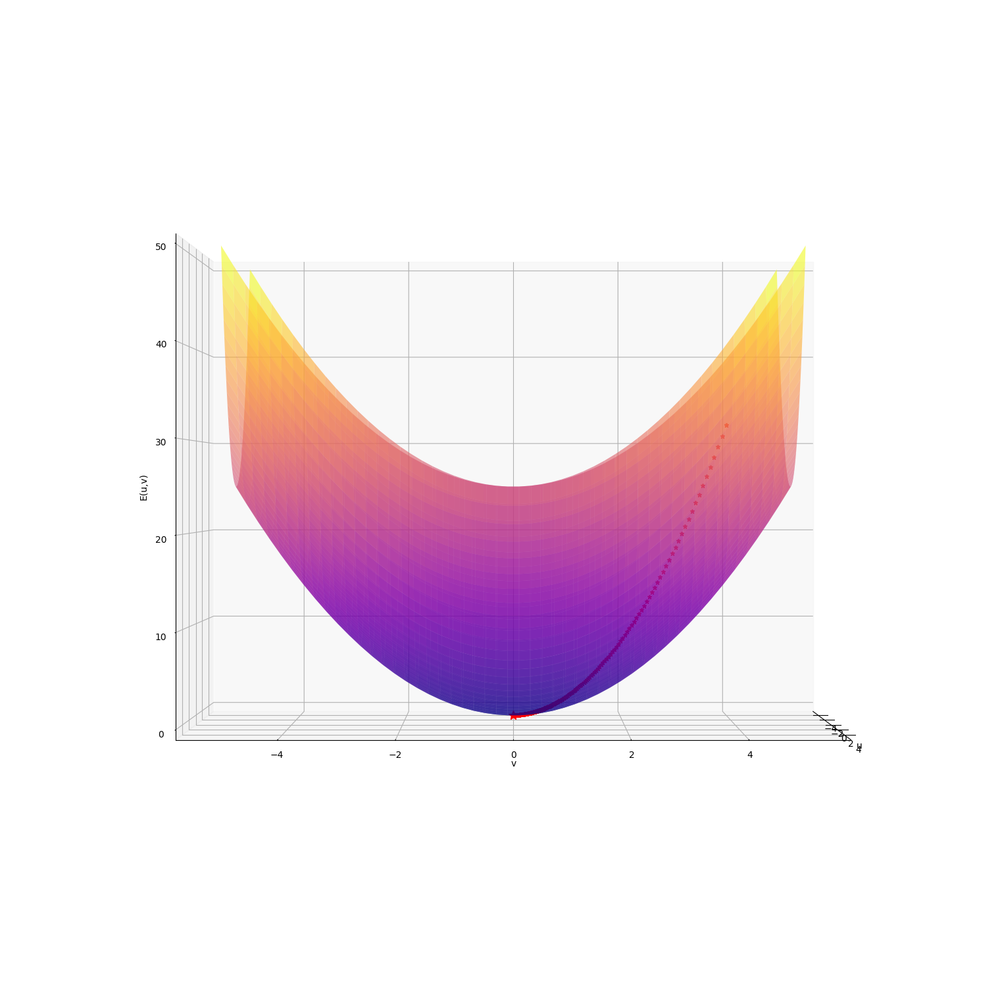

In [5]:
w, k, ws = gd(np.array([-4.0,4.0]), 0.01, gradE, E, 1e-50, show_evol = False)

display_figure(5, E, ws, [45,30], 'plasma','')
display_figure(5, E, ws, [90,90], 'plasma','')
display_figure(5, E, ws, [0,0], 'plasma','')


<font color='blue'>How many iterations has the algorithm used to converge? What point have you reached? Also comment if the behavior of the algorithm is as expected and why you consider it this way. </font>


In [6]:
print ('Number of iterations:', k)
print ('Coordinates obtained: (', w[0], ', ', w[1],')')


Number of iterations:  2936
Coordinates obtained: ( -6.947334735484934e-26 ,  6.947334735484934e-26 )


The algorithm uses 2963 iterations to reach the minimum of the function, since it has not iterated to the maximum iterations it means that it has obtained a w whose value in the function is less than *epsilon*.

 We are told that the minimum of the function is at the coordinate (0,0) so the algorithm has developed well since it has obtained a value very close to this having an iterative descent from the given initial point, lowering the value of the function by finding better coordinates up to the coordinates obtained.


#### <font color='blue'>b) Perform the same operation as in section (a), but with the normalized gradient. What differences are observed?</font>


##### Implementation


The implementation of this new function recycles the previous one, it simply normalizes the gradient.


In [7]:
'''This function is identical to the previous one, but the update of w is done with the normalized gradient'''
def gd_normalizado(w_ini, lr, grad_fun, fun, epsilon, max_iters = 100000, show_evol = False):
    it = 0
    w = w_ini.copy()
    ws = []
    ws.append(w)
    if show_evol:
      print('w_ini = ', w)
      print(fun(w))
      print(grad_fun(w))
    # Stopping criterion: number of iterations and
    # f value less than epsilon
    while (it < max_iters and fun(w) > epsilon):
        
        
        w =  w - lr * ( grad_fun(w)/np.linalg.norm(grad_fun(w)) ) 
        ws.append( w )
        it += 1

        if show_evol:
          print('w_{} = {}'.format(it,w))
          print(fun(w))
          print(grad_fun(w))

    return w, it, ws


##### Execution


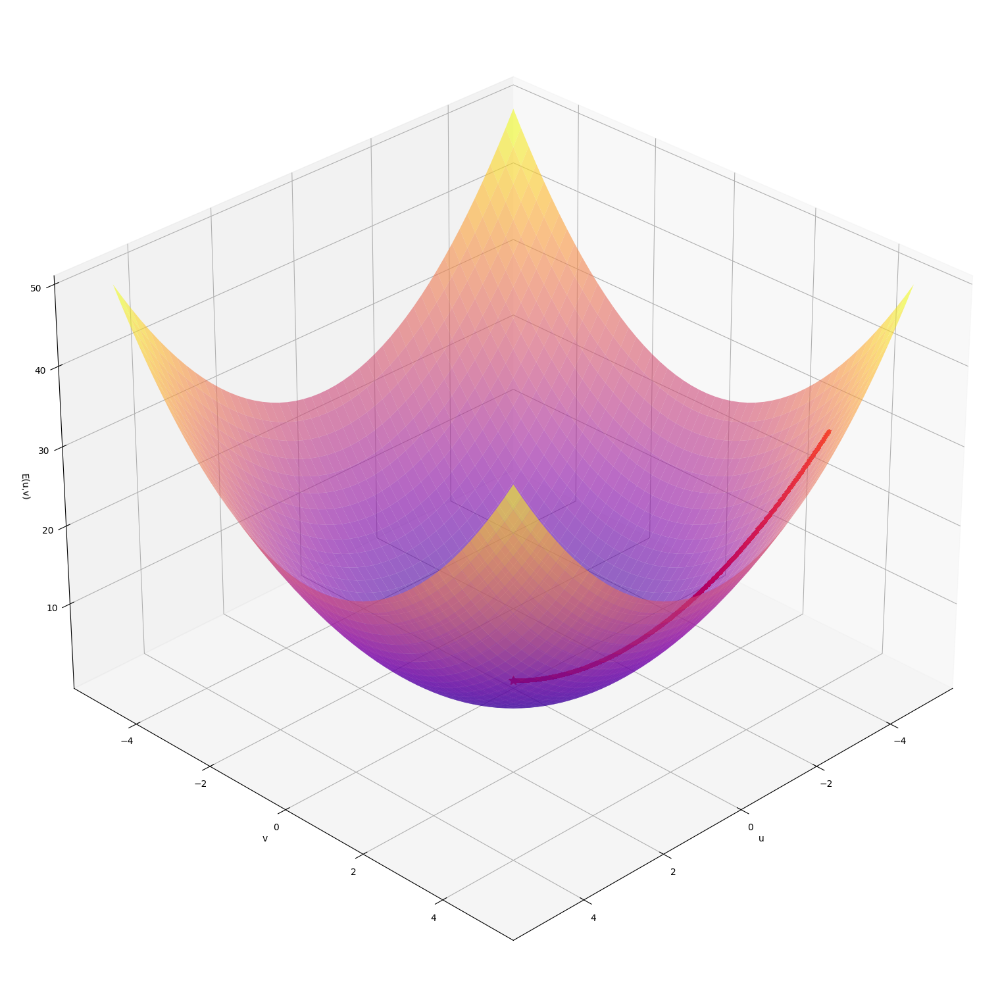

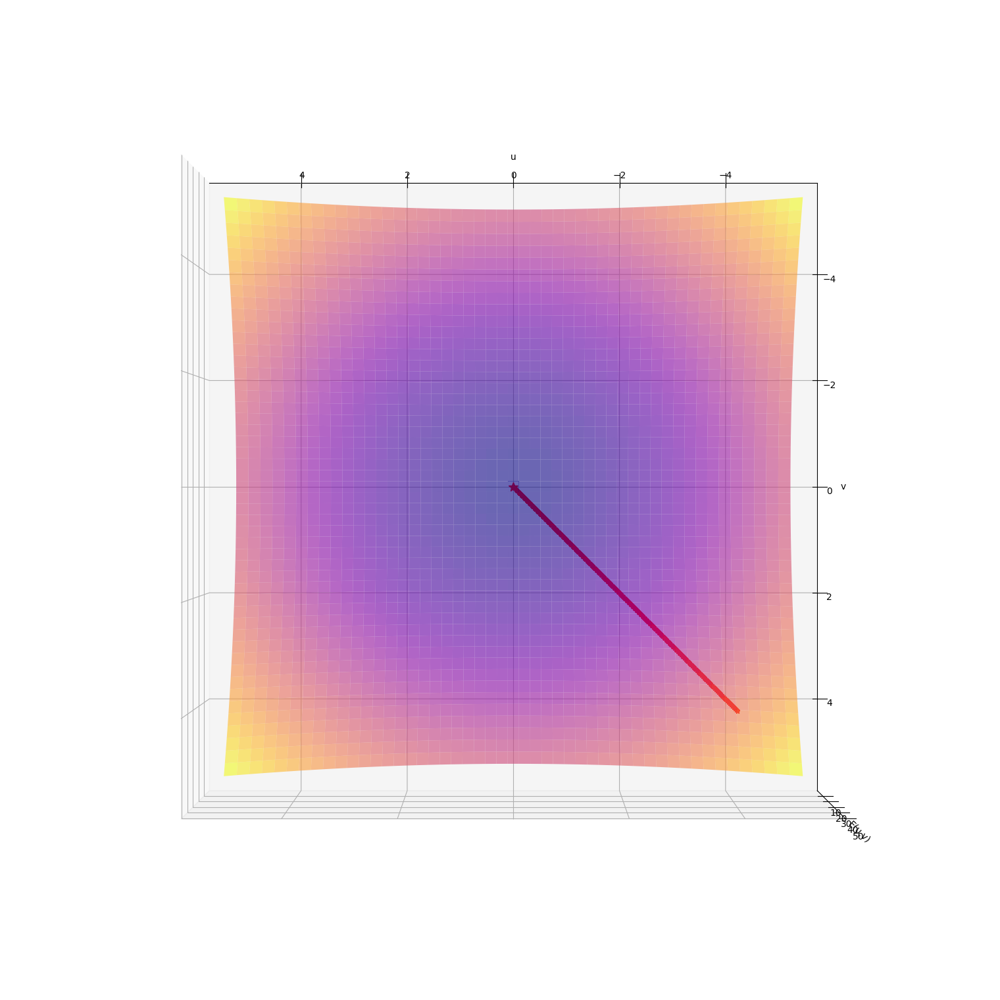

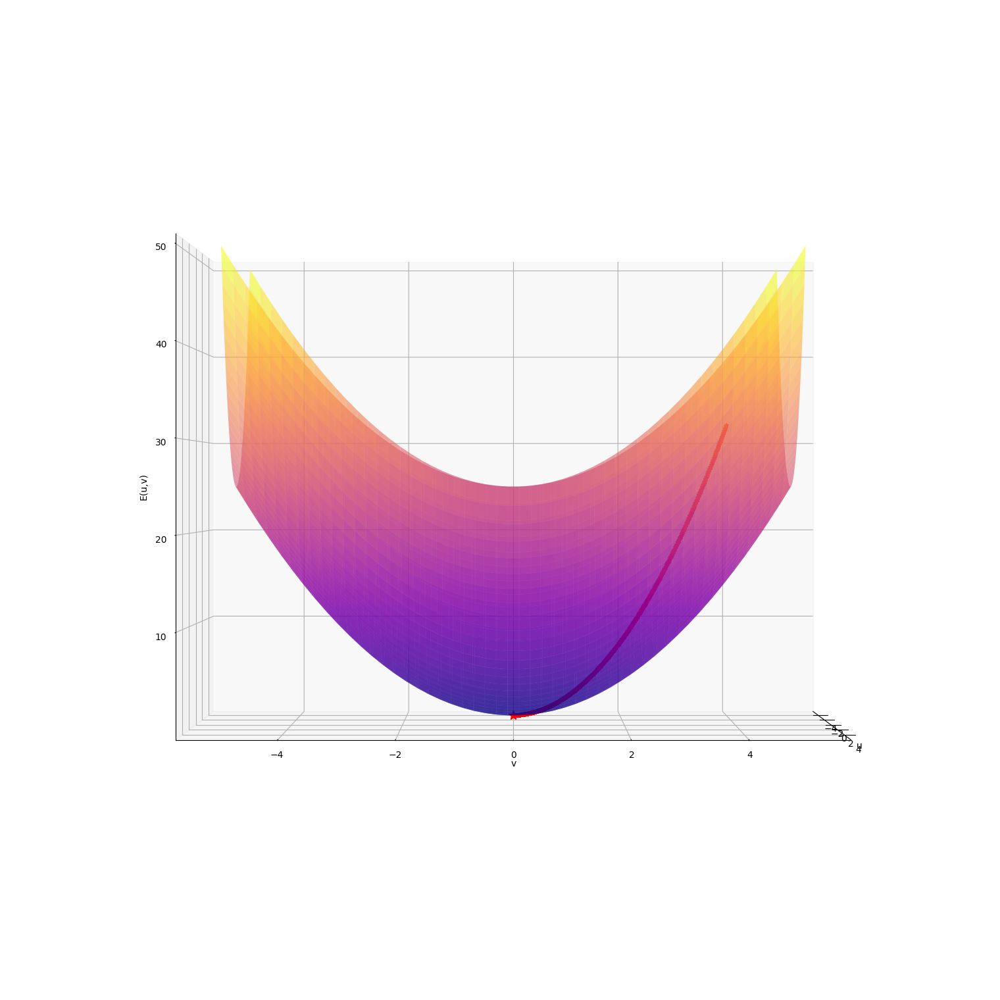

In [8]:
w, k, ws = gd_normalizado(np.array([-4.0,4.0]), 0.01, gradE, E, 1e-50, show_evol = False)
display_figure(5, E, ws, [45,30], 'plasma','')
display_figure(5, E, ws, [90,90], 'plasma','')
display_figure(5, E, ws, [0,0], 'plasma','')


##### Resultados


In [9]:
print ('Number of iterations:', k)
print ('Coordinates obtained: (', w[0], ', ', w[1],')')


Number of iterations:  100000
Coordinates obtained: ( 0.0022243815158106053 ,  -0.0022243815158106053 )


##### Diferencias observadas


When looking at the two graphs it can be seen that they are both approaching the same point, appearing to achieve the same point in both algorithms.

Furthermore, if the gradient is normalized, it is iterated up to the maximum set iterations, so the value obtained does not become less than the set *epsilon*.

* Coordinates obtained without normalization: (-6.947334735484934e-26, 6.947334735484934e-26)

* Coordinates obtained by normalizing: (0.0022243815158106053, -0.0022243815158106053)


The coordinates obtained without normalizing are closer to the point (0,0) than when normalizing, and are obtained in fewer iterations. This occurs since when normalizing the gradient it obtains a constant value of 1, needing more iterations. However, normalizing it ensures that the direction of the descending gradient is more stable and consistent due to its independence from the gradient.

In conclusion, taking into account the coordinates obtained and the number of iterations, I can say that the unnormalized algorithm achieves better results in fewer iterations.


### <font color='blue'>(2 points) Influence of learning rate. 

Consider the function $E(u, v) = u^2 + 2v^2 + 2sin(2  \pi  u) sin(\pi  v)$</font>


#### <font color='blue'>a) Analytically calculate and show the expression for the gradient of the function $E(u, v)$. Visualize this function in 3D.</font>


##### Mathematical functions used


Here the $E(u, v) = u^2 + 2v^2 + 2sin(2  \pi  u) sin(\pi  v)$</font> function is implemented


The partial derivatives of the function must also be obtained.

* $\frac{\partial E(u,v)}{\partial u}=2*u + 4*\pi*sin(\pi*v)*cos(2*\pi*u)$
* $\frac{\partial E(u,v)}{\partial v}=4*v + 2*\pi*sin(2*\pi*u)*sin(\pi*v)$

After this they join together, thus forming the gradient.


In [10]:
def E(w):
  x = w[0]
  y = w[1]
  return  x**2 + 2*y**2 + 2*np.sin(2 * np.pi * x)*np.sin(np.pi * y)
    
# Partial derivative of E with respect to u
def Eu(w):
  x = w[0]
  y = w[1]
  return  2*x + 4*np.pi*np.sin(np.pi*y)*np.cos(2*np.pi*x)

# Partial derivative of E with respect to v
def Ev(w):
  x = w[0]
  y = w[1]
  return  4*y + 2*np.pi*np.sin(2*np.pi*x)*np.cos(np.pi*y)
    
# Gradient of E
def gradE(w):
    return np.array([Eu(w), Ev(w)])


##### Representation


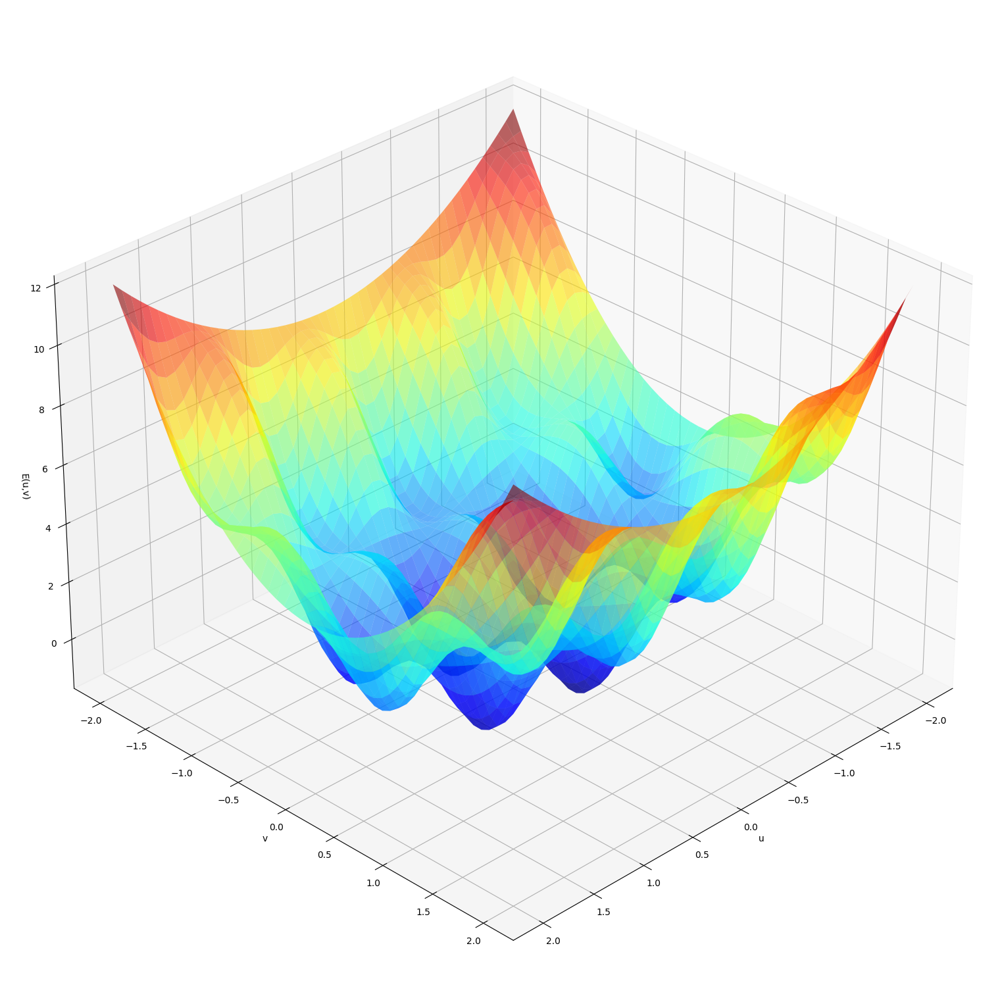

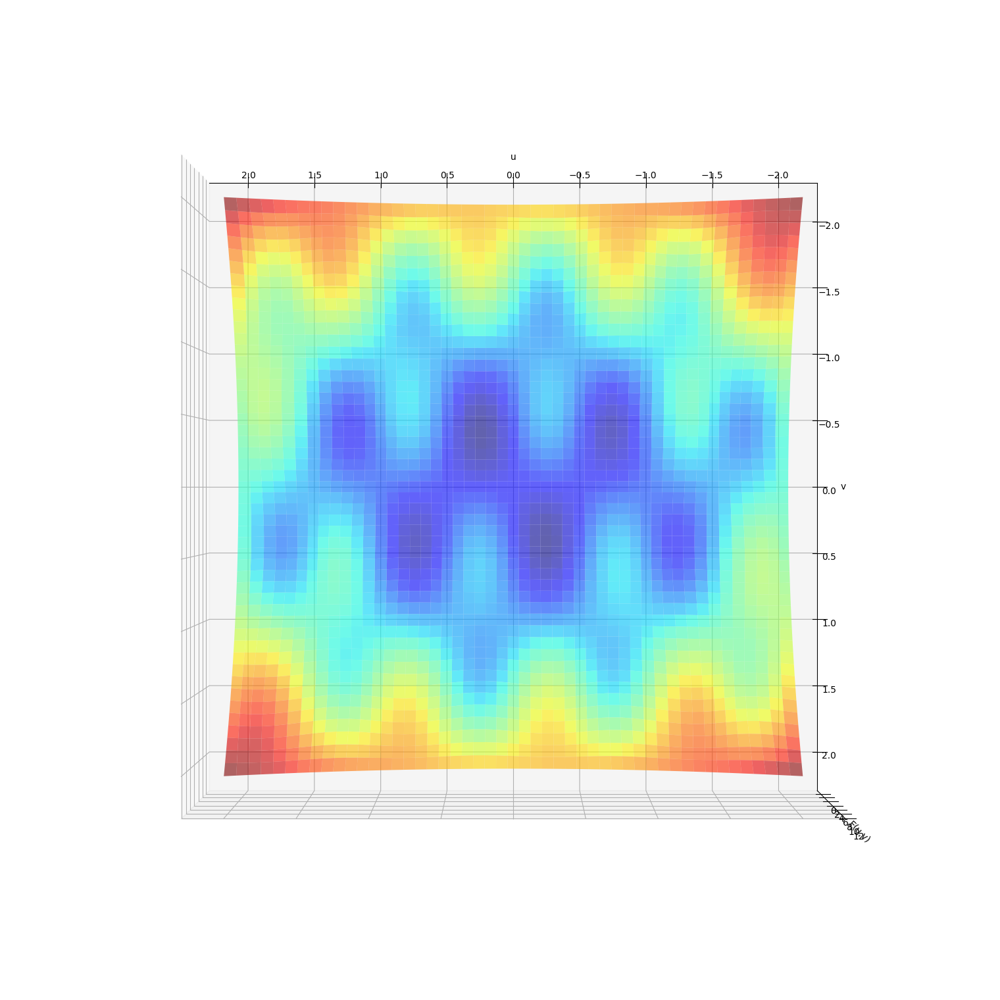

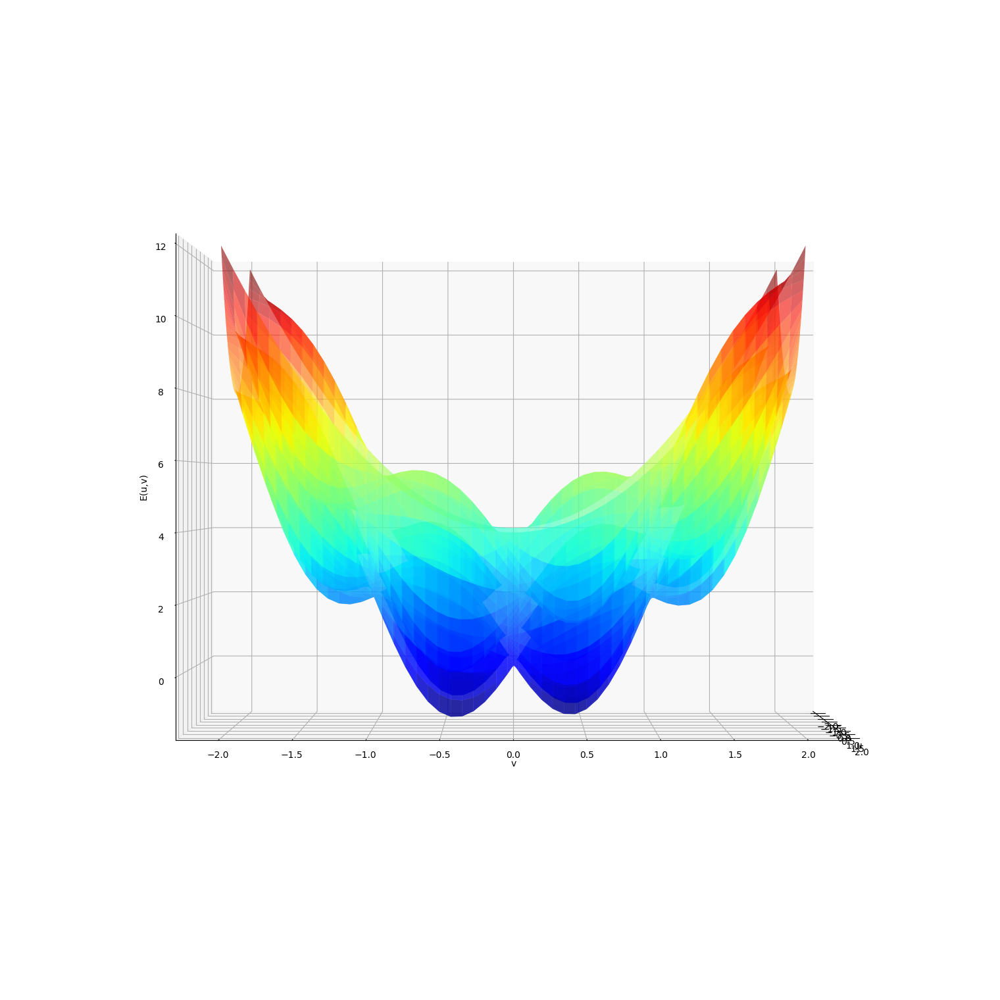

In [11]:
display_figure(2, E, [],  [45,30], 'jet', [])
display_figure(2, E, [],  [90,90], 'jet', [])
display_figure(2, E, [],  [0,0], 'jet', [])


#### <font color='blue'>b) Use gradient descent to minimize this function with different learning rate values ​​($\eta$). 
Use $(-1, 1)$ as starting point, learning rate $\eta = 0.01$ and a maximum of $100$ iterations. Generate a 2D graph showing how the value of the function ($Y$ axis) decreases with iterations ($X$ axis). </font>


##### Implementation


This function seeks to graph the value of the function in 2D using the w obtained in each iteration. 

This way you can better visualize how the value goes down in search of the local minimum.

Additionally, it reuses *display_figure*, which is a function that represents the given function with the coordinates of w obtained in each iteration.


In [12]:
'''New version of gradient descent where an epsilon is not used as a termination criterion.
On this occasion, the algorithm is always executed for a certain maximum number of iterations. 
Along with this, the values ​​of the function are saved in each iteration of the algorithm. And finally, 
displays these values in 2D. 

Students, if they prefer, can implement a single gradient descent function that, 
given the appropriate parameters, perform this visualization directly. That is, it is not mandatory
implement two gradient descent functions.'''
def gd_grafica(w, lr, grad_fun, fun, max_iters = 100):
    graf = [fun(w)]
    ws = []
    ws.append(w)
    for k in range(1,max_iters):
        w =  w - lr * grad_fun(w)
        graf.append(fun(w))
        ws.append( w )

    print('w =', w)    
    print('fun(w) =', fun(w))

    plt.figure()
    plt.plot( range(0,max_iters) , graf, '-bo')
    plt.xlabel('Iterations')
    plt.ylabel('E(u,v)')
    plt.show()
    display_figure(2, fun, ws,  [90,90], 'jet', [])


##### Experimento



Plot with learning rate igual a 0.01
w = [-1.21775622  0.41341212]
fun(w) = -0.06230891024214413


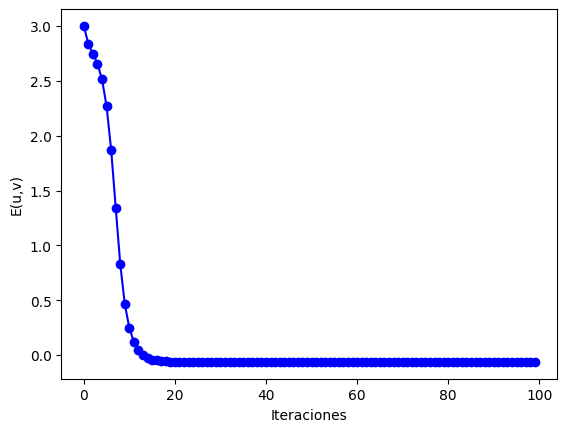

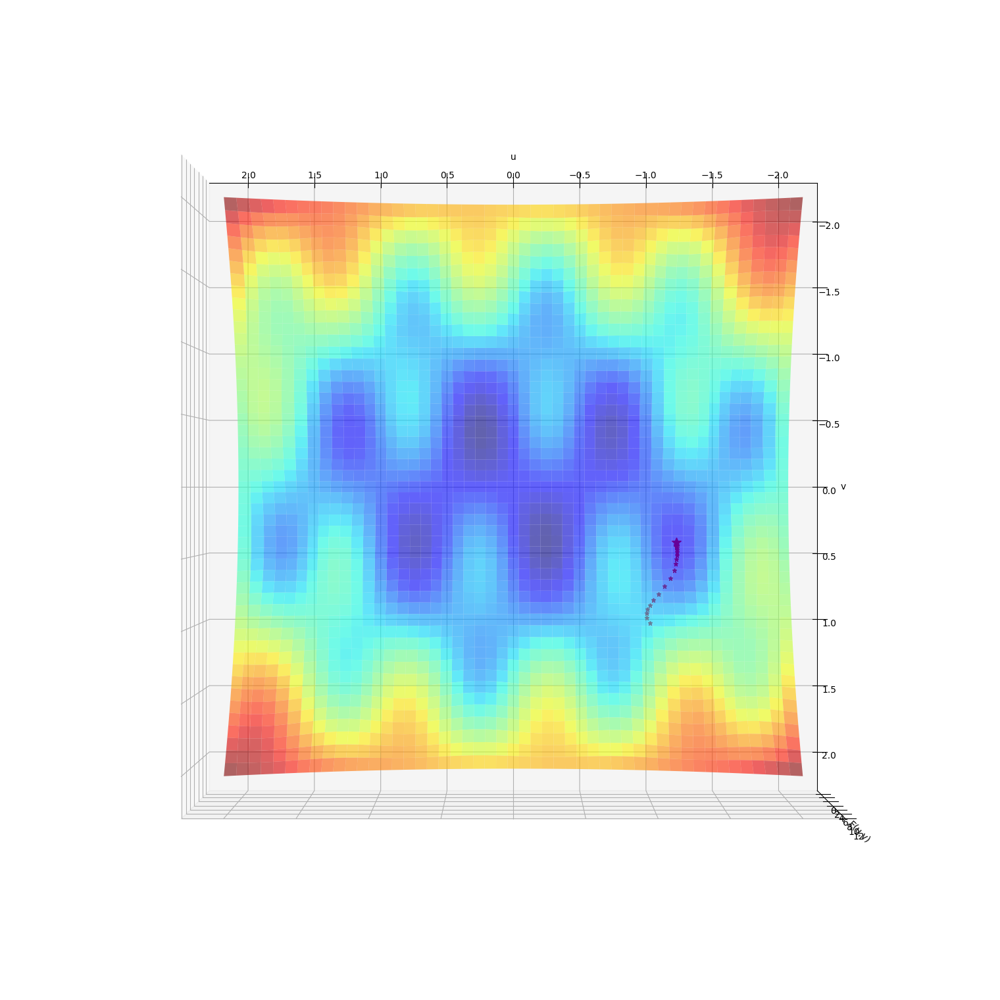

In [13]:
print ('\nGraph with learning rate equal to 0.01')
gd_grafica(np.array([-1.0,1.0]) , 0.01, gradE, E)


<font color='blue'>Repeat the experiment but using $\eta = 0.1$, comment on the differences and their dependence on $\eta$.</font>



Plot with learning rate igual a 0.1
w = [-1.20027813  0.53868178]
fun(w) = 0.13186911245950528


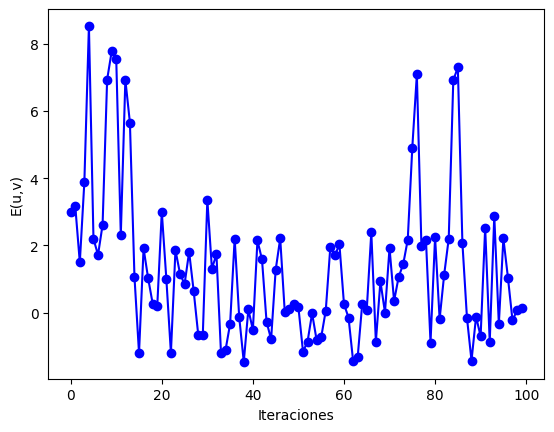

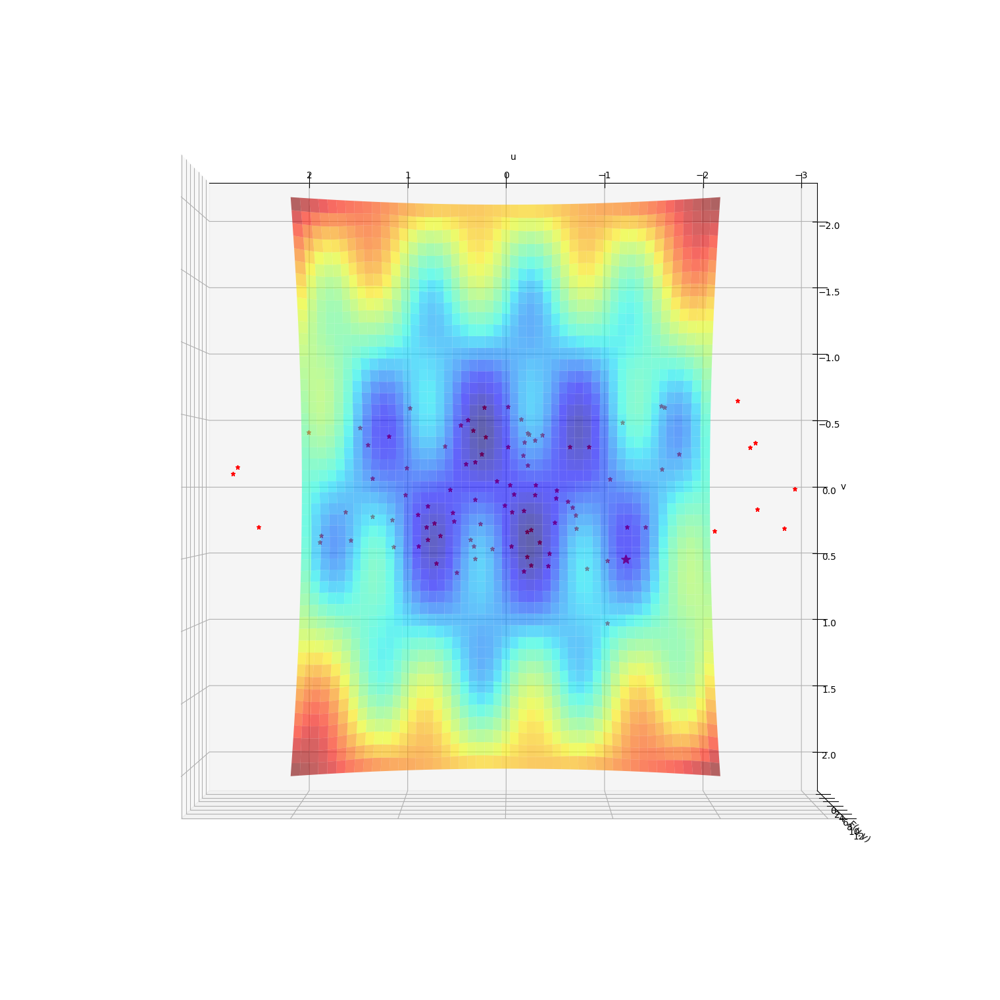

In [14]:
print ('\nGraph with learning rate equal to 0.1')
gd_grafica(np.array([-1.0,1.0]) , 0.1, gradE, E)


##### Conclusion


Thanks to these graphs we can see the importance of choosing the learning rate value well.

The learning rate (η) is a constant that is important because depending on
Its size may not reach the local optimum or have a large computational cost. 

If η is too large, it may not converge and reach the local optimum, while if it is too small, it may fall short and not reach it due to lack of iterations.

* By using η=0.01, the local optimum is quickly reached, decreasing the value of the function iteratively until it stops at 100 iterations. You can see how for many iterations it remains stable and constant with a value close to 0.
* When using η=0.1 the function does not iteratively descend, but even ascends at times, so it is not a good value for the learning rate on this occasion since it is too large.


### <font color='blue'>(2 points) Influence of the initial point and the learning rate. 

Consider now the function $E(u,v) = -cos(u) \cdot cos(v) \cdot e^{(-((u \cdot \pi)^2 + (u + \pi)^2))}$. Analytically calculate and show the expression for the gradient of the function $E(u, v)$.</font>


##### Mathematical functions


Here the $E(u,v) = -cos(u) \cdot cos(v) \cdot e^{(-((u \cdot \pi)^2 + (u + \pi)^2))}$ function is implemented


The partial derivatives of the function must also be obtained.

After this they join together, thus forming the gradient.


In [15]:
np.random.seed(1)

def E(w): 
  x = w[0]
  y = w[1]
  return -np.cos(x) * np.cos(y) * np.exp( -( ( x*np.pi )**2 + (x+np.pi)**2 )  ) 
             
# Partial derivative of E with respect to u
def Eu(w):
    x = w[0]
    y = w[1]
    return np.cos(y) * np.exp( -(x+np.pi)**2 - np.pi**2 * x**2 ) * (np.sin(x) + ( ( 2*np.pi**2 + 2 )*x + 2*np.pi )* np.cos(x) )

# Partial derivative of E with respect to v
def Ev(w):
  x = w[0]
  y = w[1]
  return np.exp( -(y+np.pi)**2 - np.pi**2 * y**2 ) * np.cos(y) * np.sin(x)
    
# Gradient of E
def gradE(w):
    return np.array([Eu(w), Ev(w)])


##### Representation


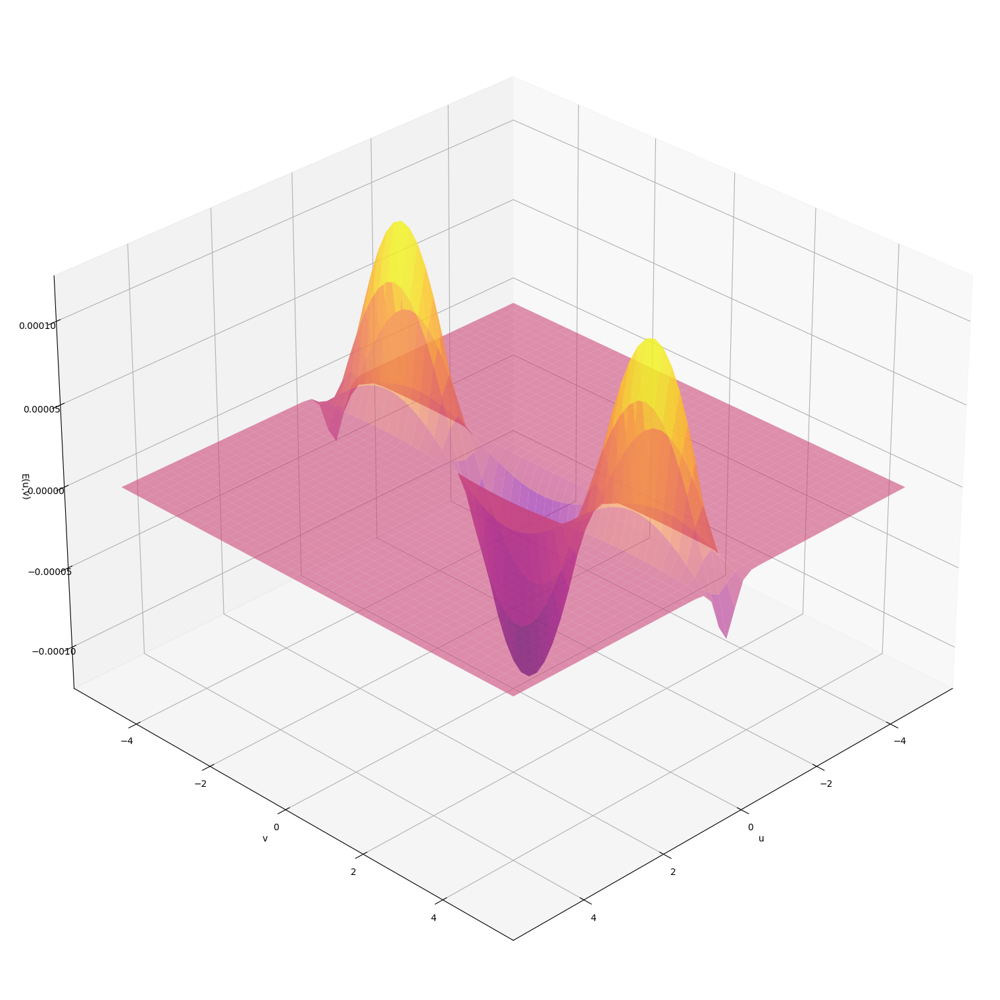

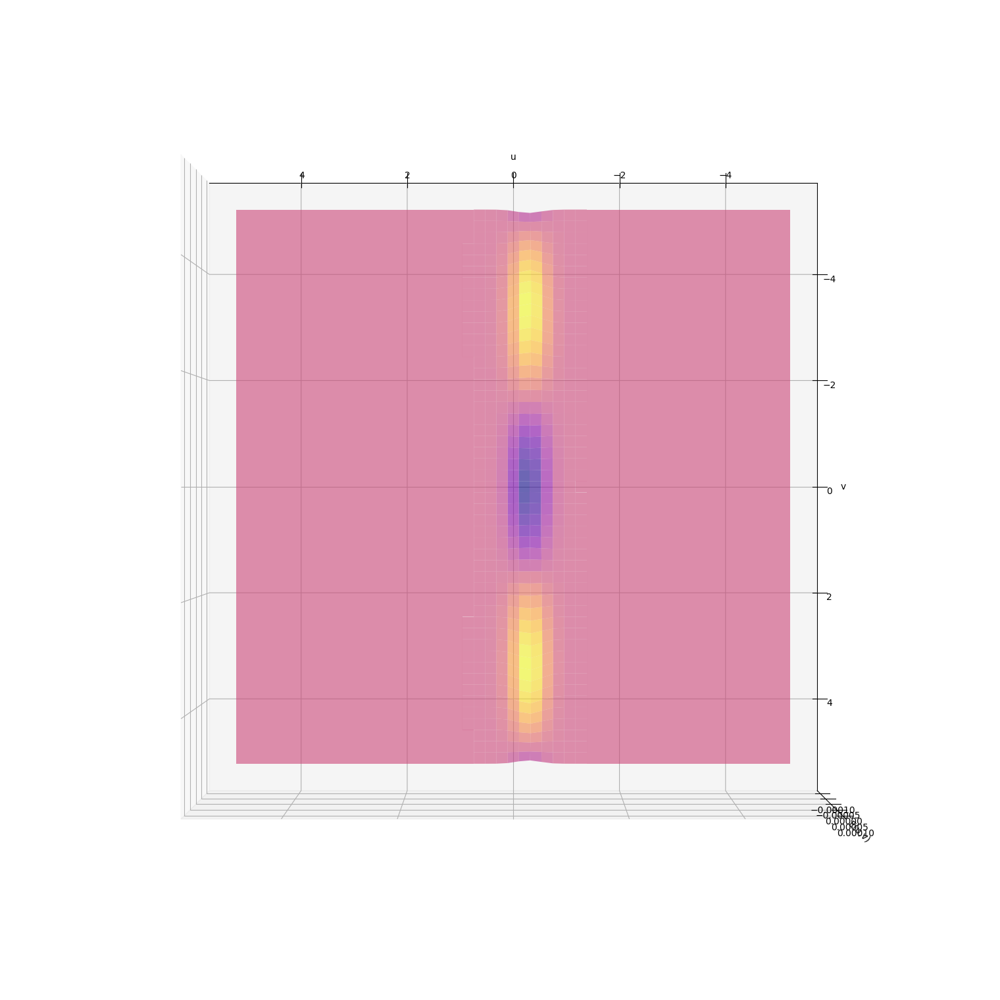

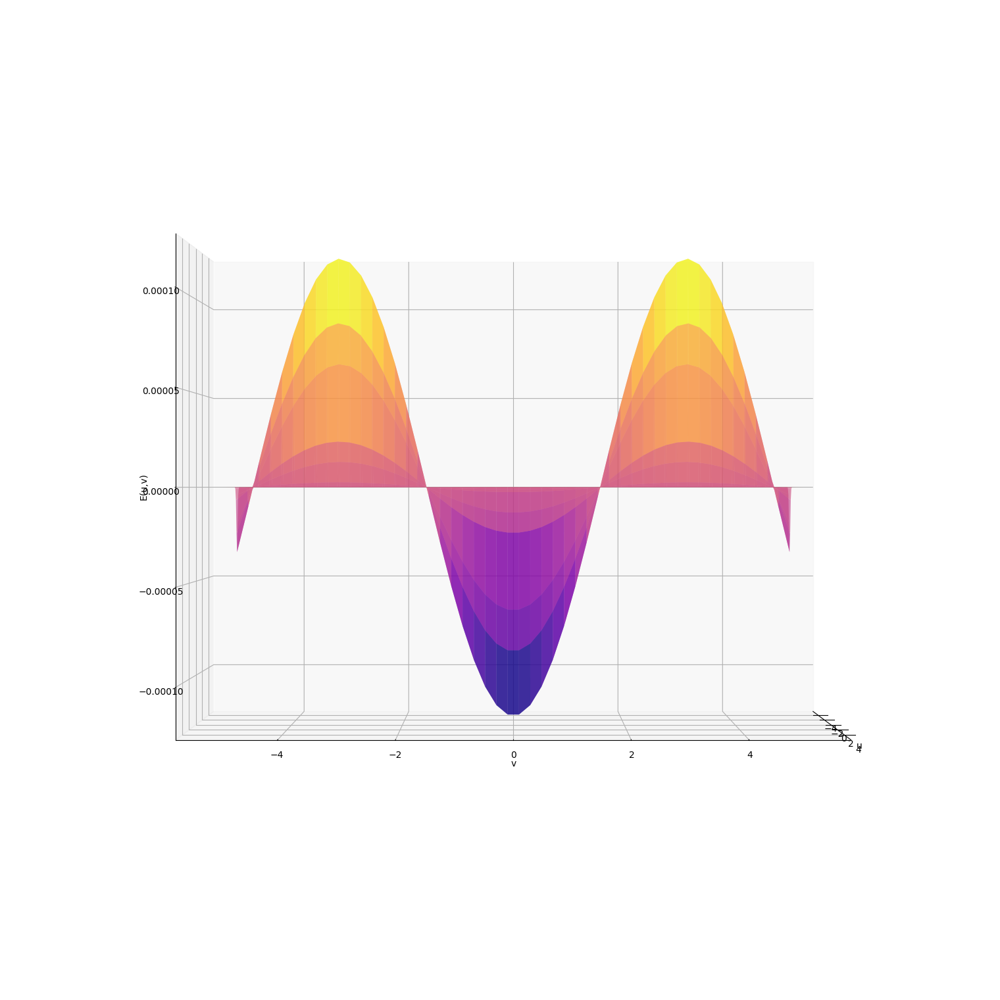

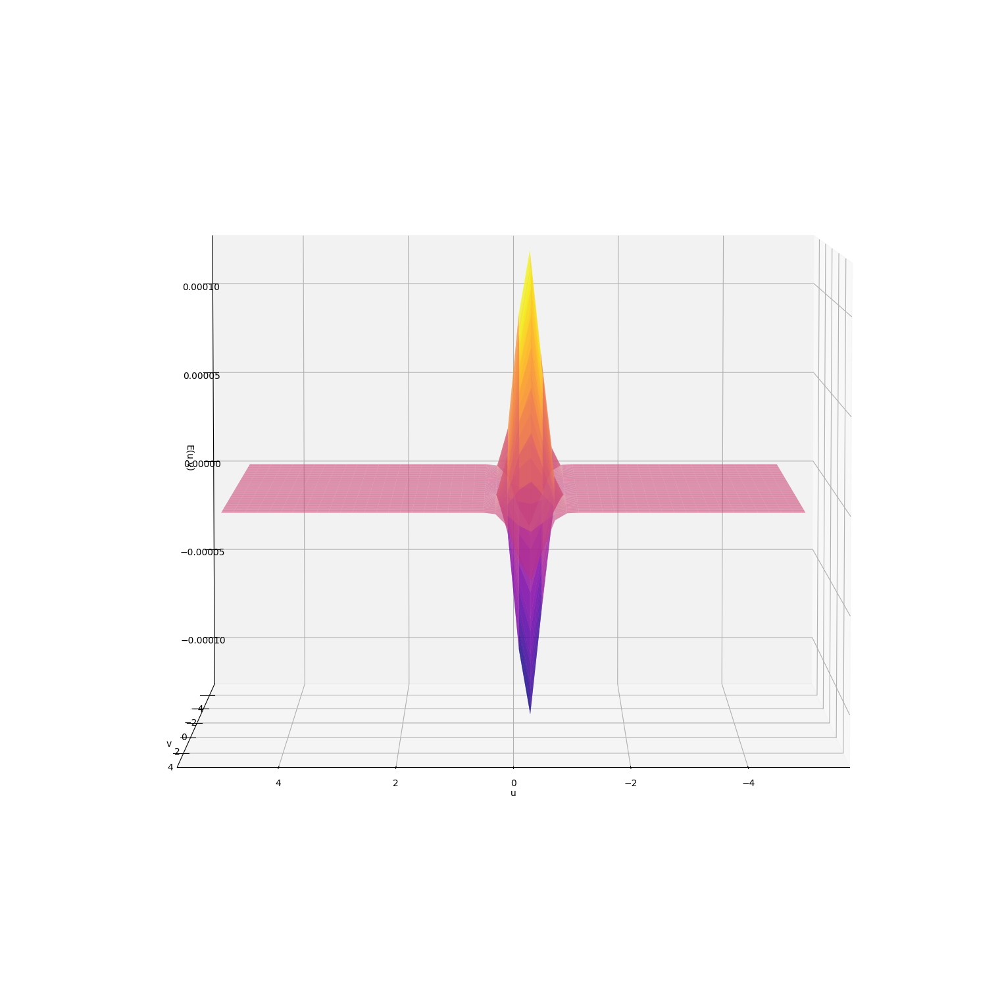

In [16]:
display_figure(5, E, [], [45,30], 'plasma','')
display_figure(5, E, [], [90,90], 'plasma','')
display_figure(5, E, [], [0,0], 'plasma','')
display_figure(5, E, [], [90,5], 'plasma','')


##### Funciones auxiliares


This function creates a 2D graph that compares 2 sets of data.


In [17]:
'''Parameters:
        arr_val - 1st Set of value pairs [X,Y]
        arr_val0 - 1st Set of value pairs [X,Y]
        arr_text - array with labels
        colur - color of arr_val data
        colur0 - color of arr_val0 data
        text_x - x axis text
        text_y - y axis text
        text_title - title text'''
def display_figure_compare2D(arr_val,arr_val0,arr_text,colur,colur0,text_x,text_y,text_title):
    
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot()
    

    ax.plot(arr_val[:,1],arr_val[:,0],color=colur,label=str(arr_text[0]))
    ax.plot(arr_val0[:,1],arr_val0[:,0],color=colur0,label=str(arr_text[1]))
       
    ax.set_xlabel(text_x)
    ax.set_ylabel(text_y)
    ax.legend()
    ax.set_title(text_title)


This function will create a graph that compares sets of data sets.


In [18]:
'''Parameters:
        arr_val - array of sets of value pairs [X,Y]
        arr_names - array with labels
        text_x - x axis text
        text_y - y axis text
        text_title - title text'''

def display_figure_compare22D(arr_val,arr_names,text_x,text_y,text_title):
    
    fig = plt.figure()
    ax = fig.add_subplot()
    
    pos=0    
    for ip in arr_val:
        ax.plot(ip[:,1],ip[:,0],label=str(arr_names[pos]))
        pos+=1
        

    ax.set_xlabel(text_x)
    ax.set_ylabel(text_y)
    ax.legend()
    ax.set_title(text_title)


This function creates a table from an array array


In [19]:
'''Parameters:
        matrix_results - matrix with the data
        dimension - dimension of the matrix
        labels - label of each column
        title - table title'''

def display_table(matriz_results,dimension,labels,title):
    fig = plt.figure(dpi=200)
    ax = fig.add_subplot(  )
    ax.axis('off')

    tabla = ax.table(
        cellText = (matriz_results),
        loc='upper left',
        colLabels=(labels),
        colColours=["palegreen"]*dimension,
        cellLoc='center'
        )
    plt.title( title )
    tabla.auto_set_font_size(False)
    tabla.set_fontsize(5)


##### Modification of the 'gd' function


This modification of the gd function additionally returns a vector that stores a tuple with the value of the function using the weights and its iteration number. This modification was made to graph later and thus see the results in a more visual way.


In [20]:
def gd_mod(w_ini, lr, grad_fun, fun, epsilon, max_iters = 100000, show_evol = False):
    it = 0
    w = w_ini.copy()
    ws = []
    ws.append(w)

    graf = []
    graf.append([fun(w) ,it] )

    if show_evol:
      print('w_ini = ', w)
      print(fun(w))
      print(grad_fun(w))
    # Stopping criterion: number of iterations and
    # f value less than epsilon
    while (it < max_iters and fun(w) > epsilon):
        
        w =  w - ( lr * grad_fun(w) ) 
        it += 1
        ws.append( w )
        graf.append([fun(w) ,it] )

        if show_evol:
          print('w_{} = {}'.format(it,w))
          print(fun(w))
          print(grad_fun(w))

    return w, it, ws, graf


##### Experimentation


<font color='blue'>Use gradient descent to find a minimum of this function, starting from the following starting points: $(-4.0, 4.0), (-0.2,-3.0), (0.4,0.0), (-0.25,-2.0)$, using two learning rates ($0.1$ and $0.01$), and a maximum number of iterations of $250.000$. A table should be displayed that associates starting points and learning rates with the coordinates reached and the value of the function at said end points. </font>


* Initial points are saved in a vector called *initial_points*
* To later make the results table, two matrices are created, one will save the data results by applying one η or another.
* To graph the results, two vectors are saved to which tuples of the value of the function will be added with their corresponding iteration.


In [21]:
initial_points = np.array([[-4.0,4.0],[-0.2,-3.0],[0.4,0.0],[-0.25,-2.0]])
arr_initial_points = np.array(initial_points)

matriz_results_eta0 = np.array(np.zeros((4,5)))  # Array that will store the table
matriz_results_eta1 = np.array(np.zeros((4,5)))  # Array that will store the table

valores_results_eta0 = []                        # It will be used in the graph
valores_results_eta1 = []                        # It will be used in the graph

eta0=0.1
eta1=0.01


The initial points are looped by applying 'gd' with an lr of 0.1 and 0.01. The data is saved in a matrix that will act as a table


In [22]:
pos=0
for ip in initial_points:                                           # Loop in which
    w0,it0,ws0,val0 = gd_mod(ip, eta0, gradE, E, float('-inf'), max_iters=250000, show_evol = False)     # fill out the matrix
    w1,it1,ws1,val1 = gd_mod(ip, eta1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)     # fill out the matrix


    x_ini =   np.format_float_scientific(ip[0], precision = 2)                       
    y_ini =   np.format_float_scientific(ip[1], precision = 2)

    w_0_eta0   =   np.format_float_scientific(w0[0], precision = 2)
    w_1_eta0   =   np.format_float_scientific(w0[1], precision = 2)
    f_eta0     =   np.format_float_scientific(E(w0), precision = 2)

    w_0_eta1   =   np.format_float_scientific(w1[0], precision = 2)
    w_1_eta1   =   np.format_float_scientific(w1[1], precision = 2)
    f_eta1     =   np.format_float_scientific(E(w1), precision = 2)     

    matriz_results_eta0[pos] = [x_ini,y_ini,w_0_eta0,w_1_eta0,f_eta0]
    matriz_results_eta1[pos] = [x_ini,y_ini,w_0_eta1,w_1_eta1,f_eta1] 

    valores_results_eta0.append(val0)       
    valores_results_eta1.append(val1)                                         
    pos +=1


##### Resultados


###### Tablas


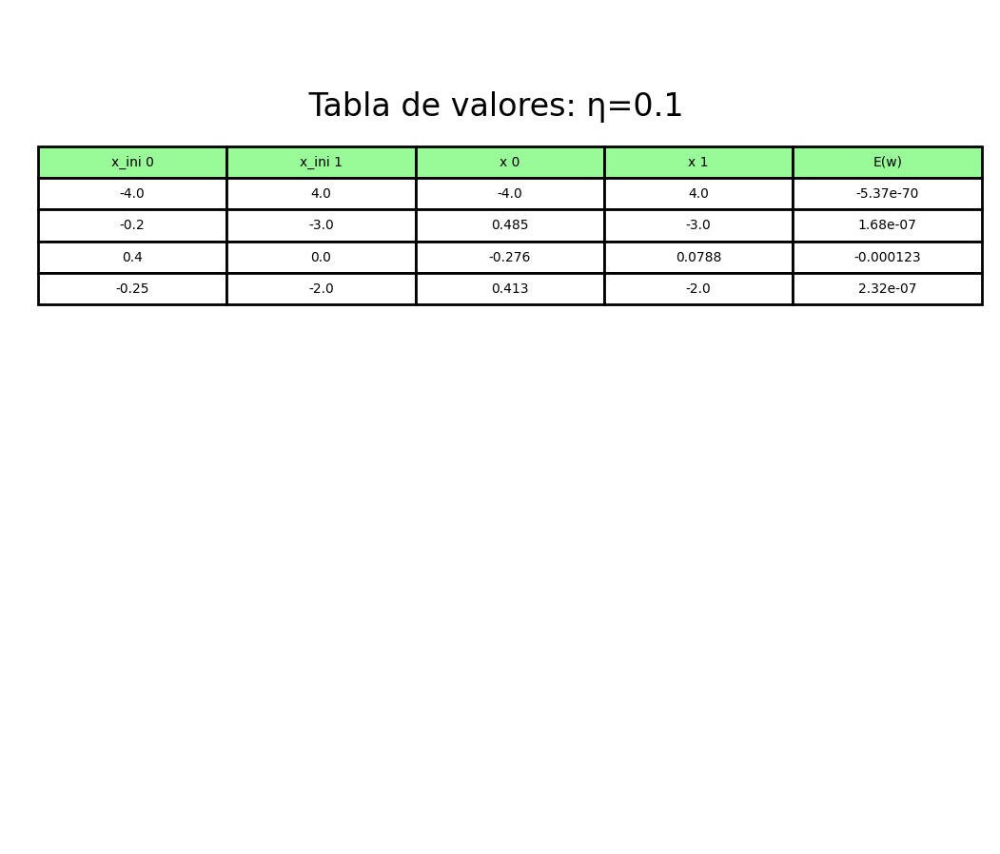

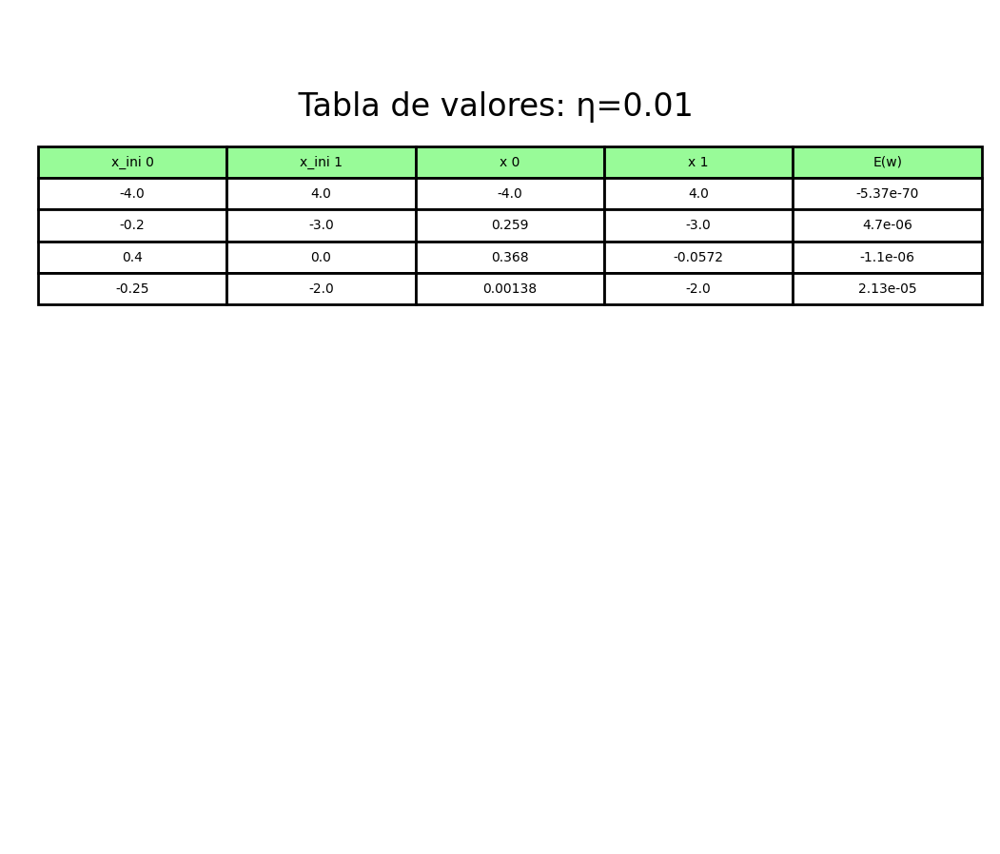

In [23]:
labels = ['x_ini 0','x_ini 1','x 0','x 1','E(w)']
title_eta0 = '\n\n Table of values: η='+str(eta0)
title_eta1 = '\n\n Table of values: η='+str(eta1)

display_table(matriz_results_eta0,5,labels,title_eta0)
display_table(matriz_results_eta1,5,labels,title_eta1)


With the help of the previous graphs we can observe the importance of the initial point.

For η = 0.1

* In the first point we observe that being surrounded by coordinates with the same value, it is unable to find better coordinates to lower the value of the function, remaining anchored in its position.

* The second and fourth points end with a value similar to the first point, close to 0.0

* The third point manages to reach a lower value, being the best value obtained

By observing how the algorithm has been developed, we can conclude the importance of the initial point, since there may be points like the first one that do not advance, and points like the last one that obtained better results. However, no more learning rates have been used to compare nor is the lowest point of the function known, so it could be too large and only approach it, getting trapped and therefore not getting the exact coordinate.

For η = 0.01

* The first point does not move either, it maintains its coordinates.
* The second point is close but achieves a worse result than when using η=0.1, so it could be thought that when using a smaller η there have been missing iterations
* The third point is the one that has given the best results with this η, but it is worse than when using η = 0.1, so the same thing has happened to the second point.
* The last point is the one that has given the worst results, indicating that the same thing has happened to the previous 2 points.


In conclusion, it can be said that the initial point is of great importance to obtain good results. An example of this is the third point, which is the one that has given the best results. However, it has fallen short in the test with a η = 0.01, lacking iterations to achieve convergence.


###### Graficas


In [24]:
arr_valores_results_eta0 = np.array(valores_results_eta0)
arr_valores_results_eta1 = np.array(valores_results_eta1)


This graph shows the behavior of the value of the function in each iteration when executing the algorithm using a learning rate of 0.1


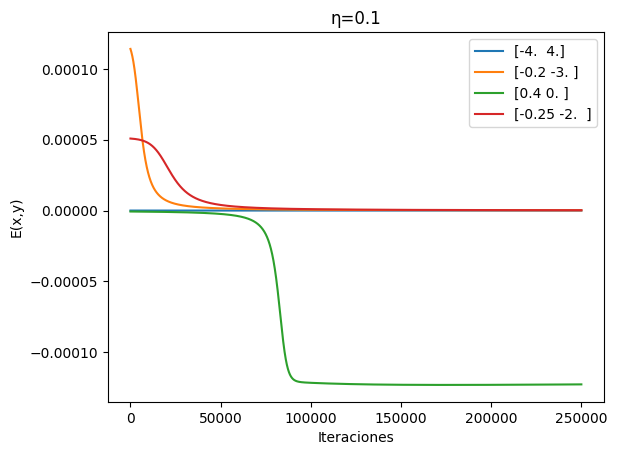

In [25]:
title = 'η='+str(eta0)
display_figure_compare22D(arr_valores_results_eta0, arr_initial_points, 'Iterations', 'E(x,y)', title)


It can be seen how the algorithm acts on all the initial points while using a η of 0.1.

* In the first point it remains constant since its value does not change at any time as the coordinates do not change.
* The second point is capable of quickly lowering its value but remains with a constant value as seen in the graph, so even with 250,000 iterations it may not be enough or perhaps it has been trapped in that coordinate.
* The third point does manage to lower its value, although it remained quite constant at the beginning, it managed to decrease its value to continue its constancy, being the best result obtained in this experiment with η = 0.1
* The fourth point manages to decrease the value of the function gradually but like the second point it could not achieve a lower value.


This graph shows the behavior of the value of the function in each iteration when executing the algorithm using a learning rate of 0.01


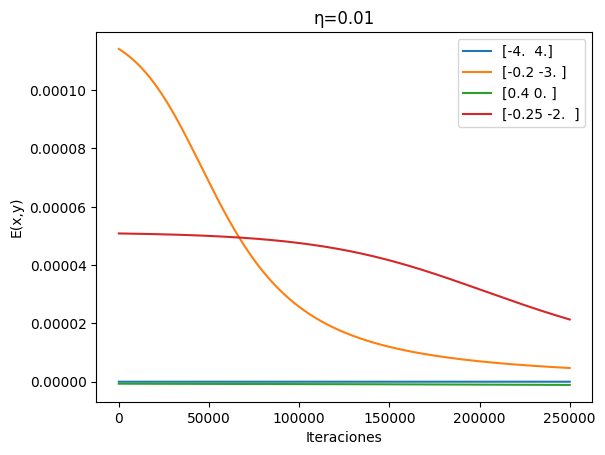

In [26]:
title = 'η='+str(eta1)
display_figure_compare22D(arr_valores_results_eta1,arr_initial_points,'Iterations','E(x,y)',title)


It can be seen how the algorithm acts on all the initial points while using a η of 0.1.

* In the first point, as with the previous one, it remains constant.
* The second point is capable of going down but does not reach the necessary iterations to continue going down
* The third point manages to reduce its value a little, it is the one that gives the best result using this η, but it is not able to lower it even more as it did with η=0.1
* The fourth point happens the same as the second, being the one with the worst results.

With these results in mind, I conclude that the initial points are important for cases like the first point, and the learning rate is also of great importance because it can fall short and fail to converge.


##### If you want to check the result individually using each initial coordinate, execute the code below


In [27]:
coord1=np.array([-4.0,4.0])
coord2=np.array([-0.2,-3.0])
coord3=np.array([0.4,0.0])
coord4=np.array([-0.25,-2.0])


###### Coordenada: [-4.0,4.0]


* Se utiliza un η = 0.1


--- Coordenada inicial  [-4.  4.]  ---
Learning rate  0.1
Coordinates obtained: ( -4.0 ,  4.0 )
Valor alcanzado:  -5.365754088440153e-70


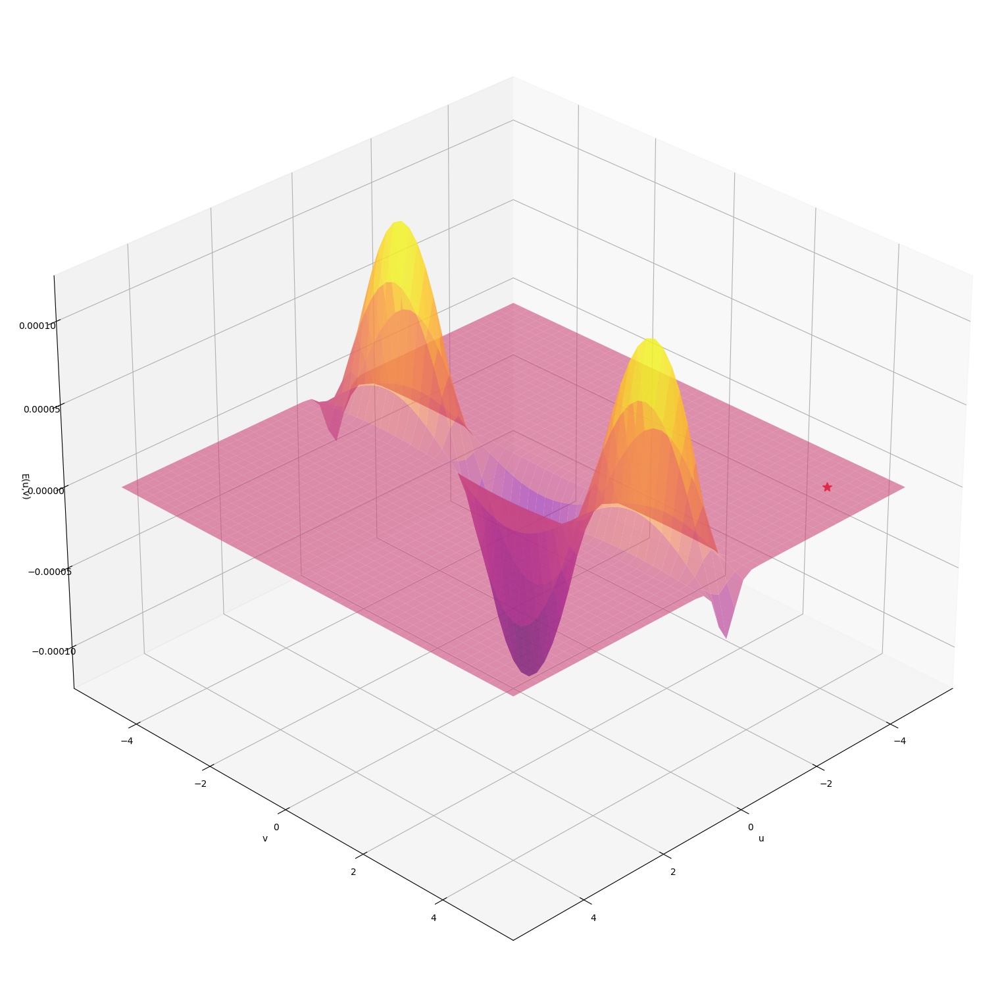

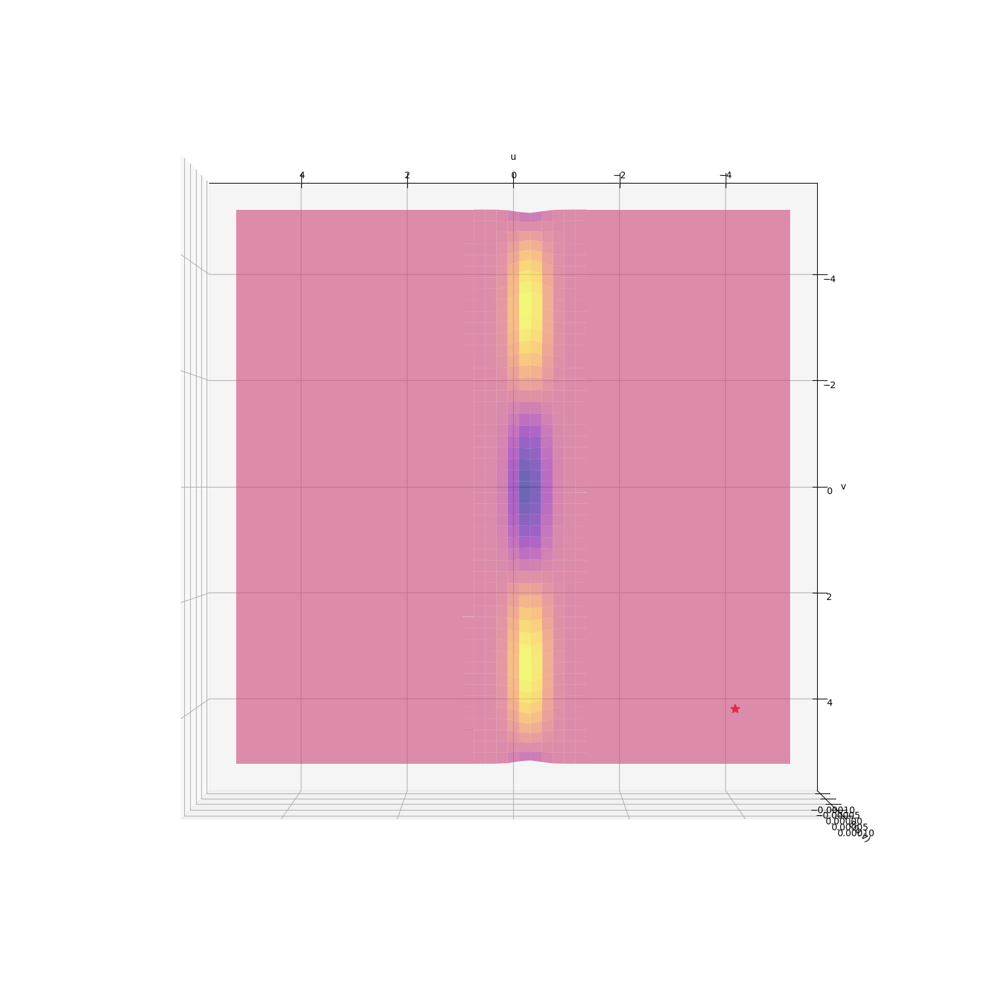

In [28]:
w_c0, k_c0, ws_c0, val0  = gd_mod(coord1, eta0, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord1,' ---')
print('Learning rate ',eta0)
print('Coordinates obtained: (', w_c0[0], ', ', w_c0[1],')')
print('Value achieved:', E(w_c0))
display_figure(5, E, ws_c0, [45,30], 'plasma','')
display_figure(5, E, ws_c0, [90,90], 'plasma','')


* Se utiliza un η = 0.01


--- Coordenada inicial  [-4.  4.]  ---
Learning rate  0.01
Coordinates obtained: ( -4.0 ,  4.0 )
Valor alcanzado:  -5.365754088440153e-70


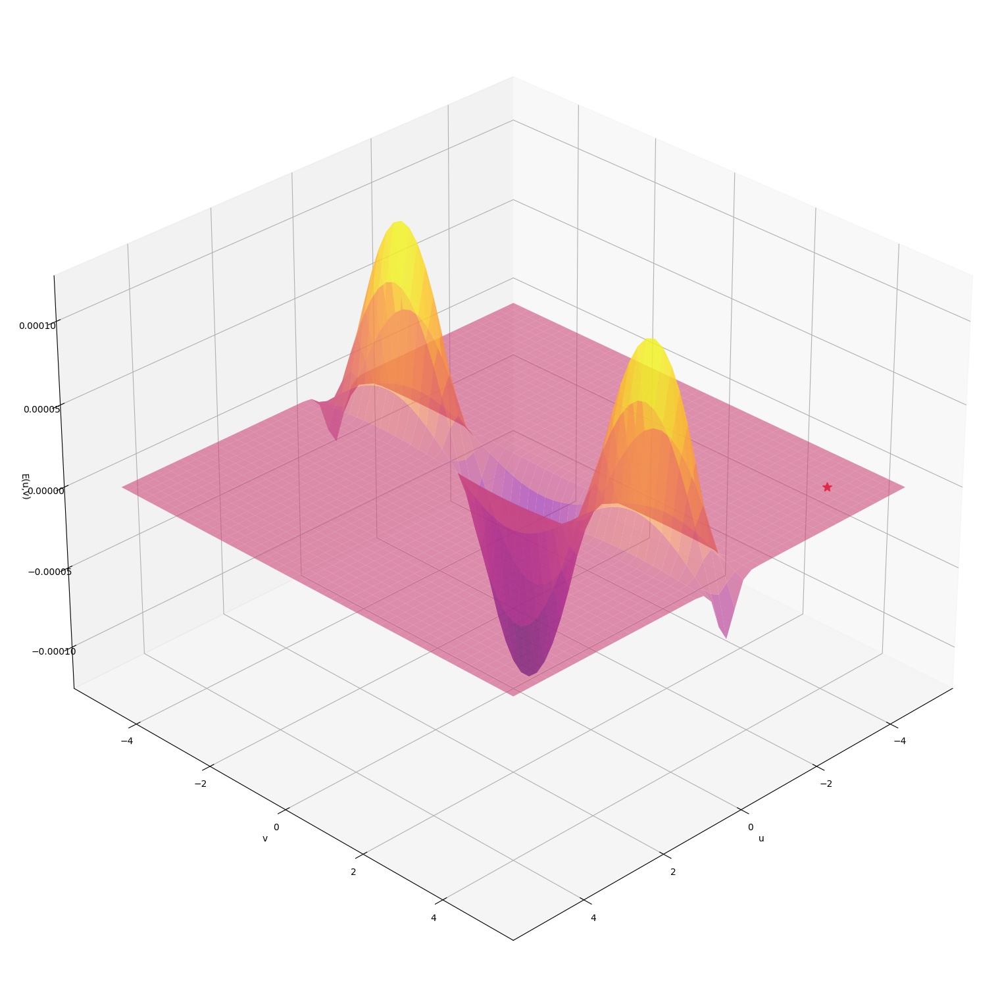

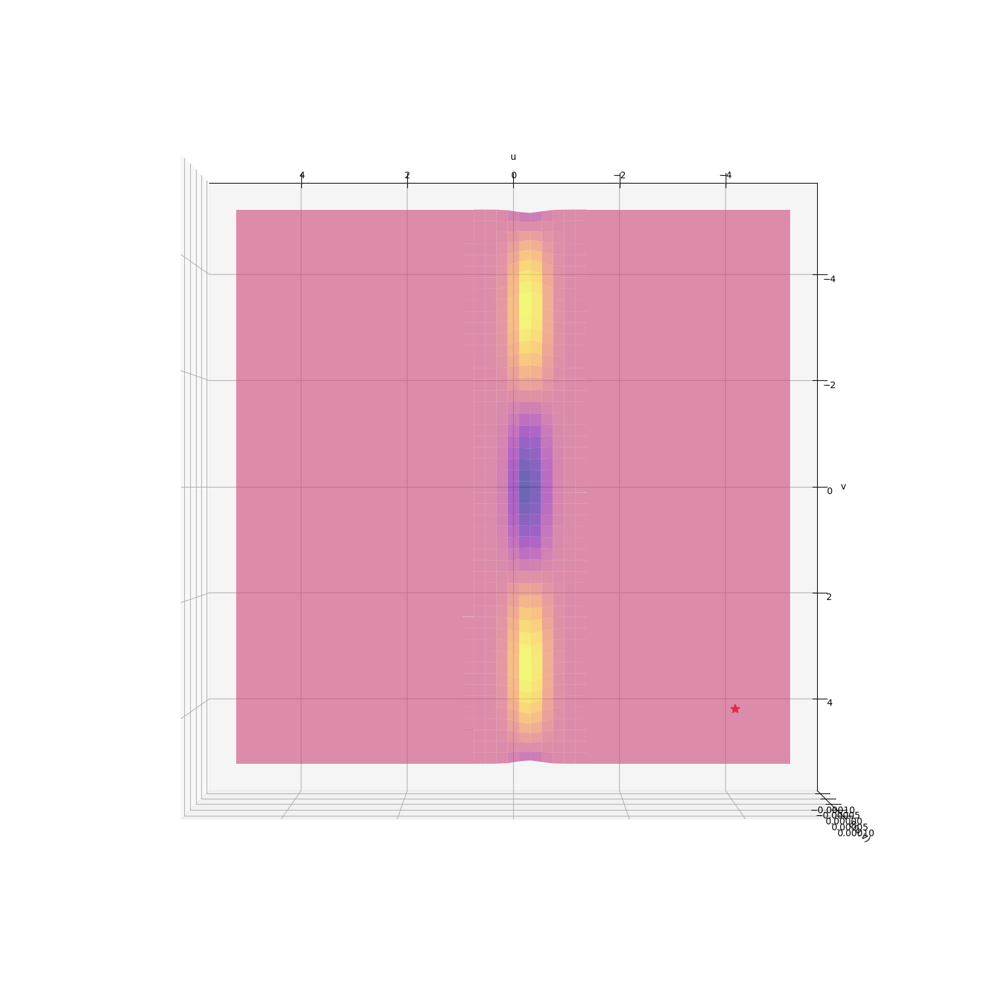

In [29]:
w_c1, k_c1, ws_c1, val1  = gd_mod(coord1, eta1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord1,' ---')
print('Learning rate ',eta1)
print('Coordinates obtained: (', w_c1[0], ', ', w_c1[1],')')
print('Value achieved:', E(w_c1))
display_figure(5, E, ws_c1, [45,30], 'plasma','')
display_figure(5, E, ws_c1, [90,90], 'plasma','')


In [30]:
arr_val0 = np.array(val0)
arr_val1 = np.array(val1)
ta = []                         # Auxiliary array for labels
ta.append('η='+str(eta0))       #η = 0.1
ta.append('η='+str(eta1))        #η = 0.01
arr_ta = np.array(ta)


Graph that compares the value of the function in each iteration of the first point using η=0.1 and η=0.01


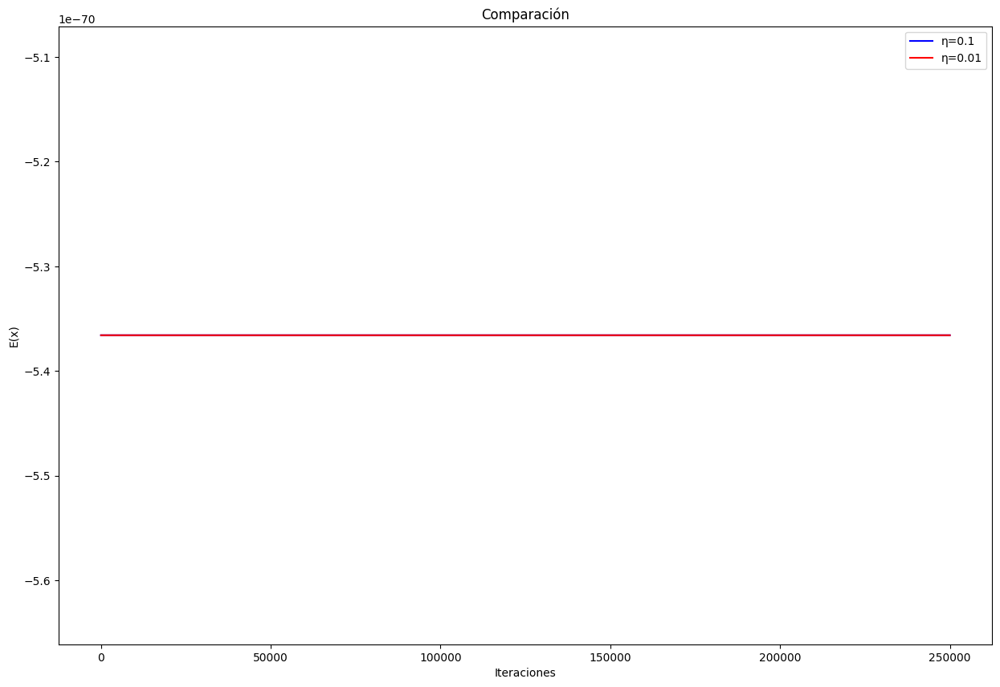

In [31]:
display_figure_compare2D(arr_val0,arr_val1,arr_ta,'blue','red','Iterations','E(x)','Comparison')


As you can see, the graph remains constant because this first point does not decrease.


###### Coordenada: [-0.2,-3.0] 


* Se utiliza un η = 0.1


--- Coordenada inicial  [-4.  4.]  ---
Learning rate  0.1
Coordinates obtained: ( 0.48456157259415455 ,  -3.0 )
Valor alcanzado:  1.680946274749496e-07


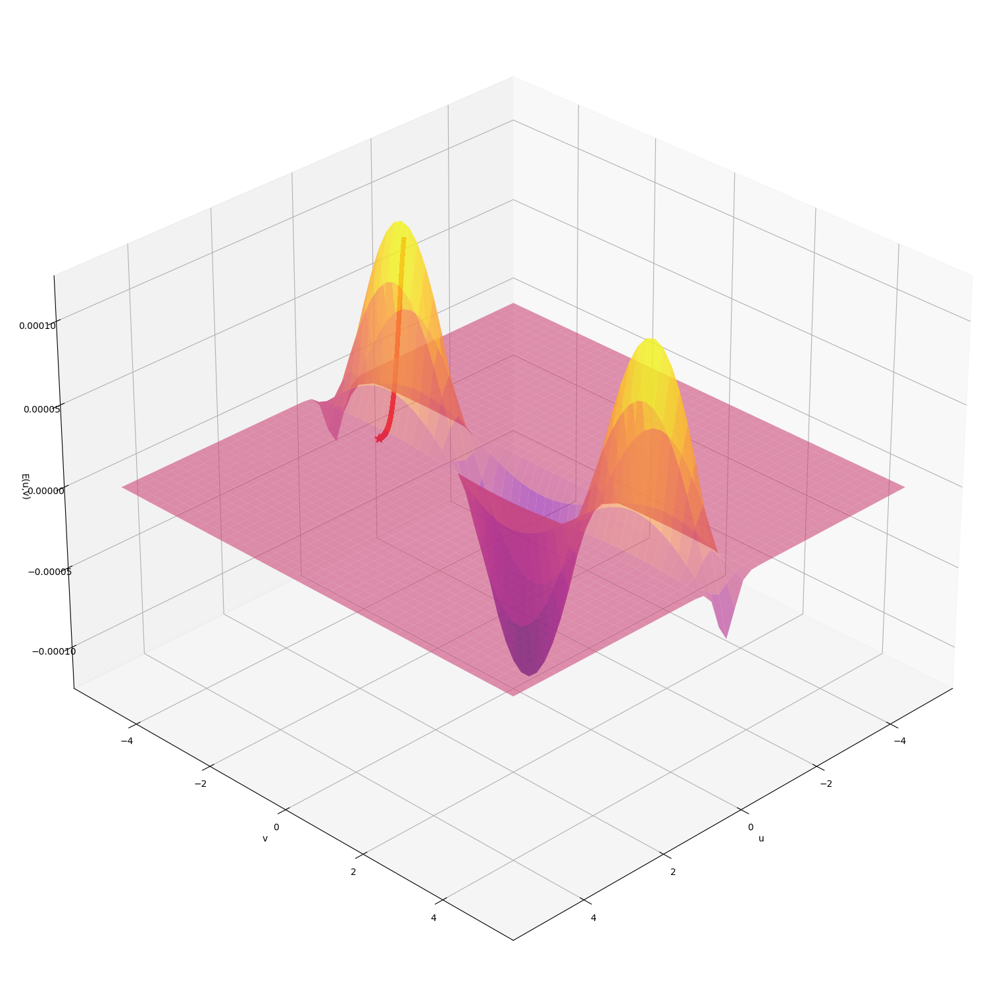

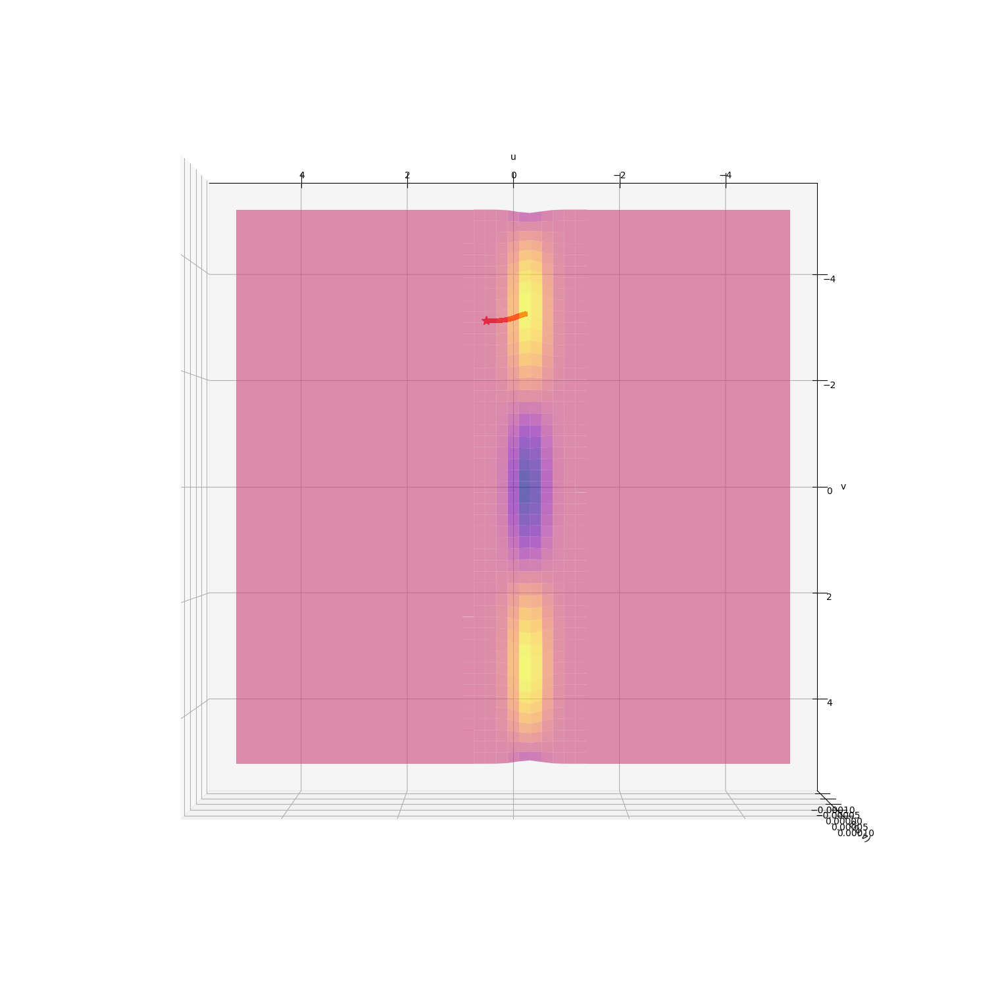

In [32]:
w_c0, k_c0, ws_c0, val0  = gd_mod(coord2, eta0, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord1,' ---')
print('Learning rate ',eta0)
print('Coordinates obtained: (', w_c0[0], ', ', w_c0[1],')')
print('Value achieved:', E(w_c0))
display_figure(5, E, ws_c0, [45,30], 'plasma','')
display_figure(5, E, ws_c0, [90,90], 'plasma','')


* Se utiliza un η = 0.01


--- Coordenada inicial  [-0.2 -3. ]  ---
Learning rate  0.01
Coordinates obtained: ( 0.2587628383071375 ,  -3.0 )
Valor alcanzado:  4.703583346626769e-06


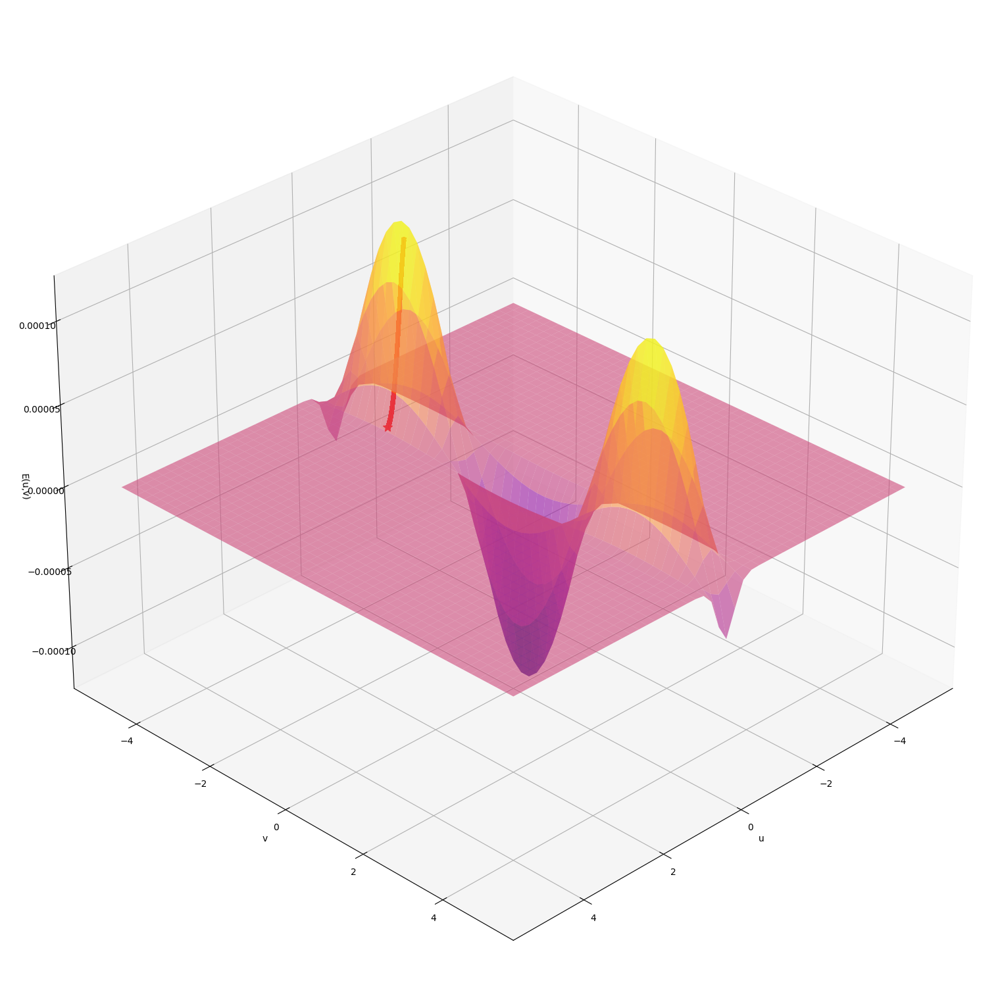

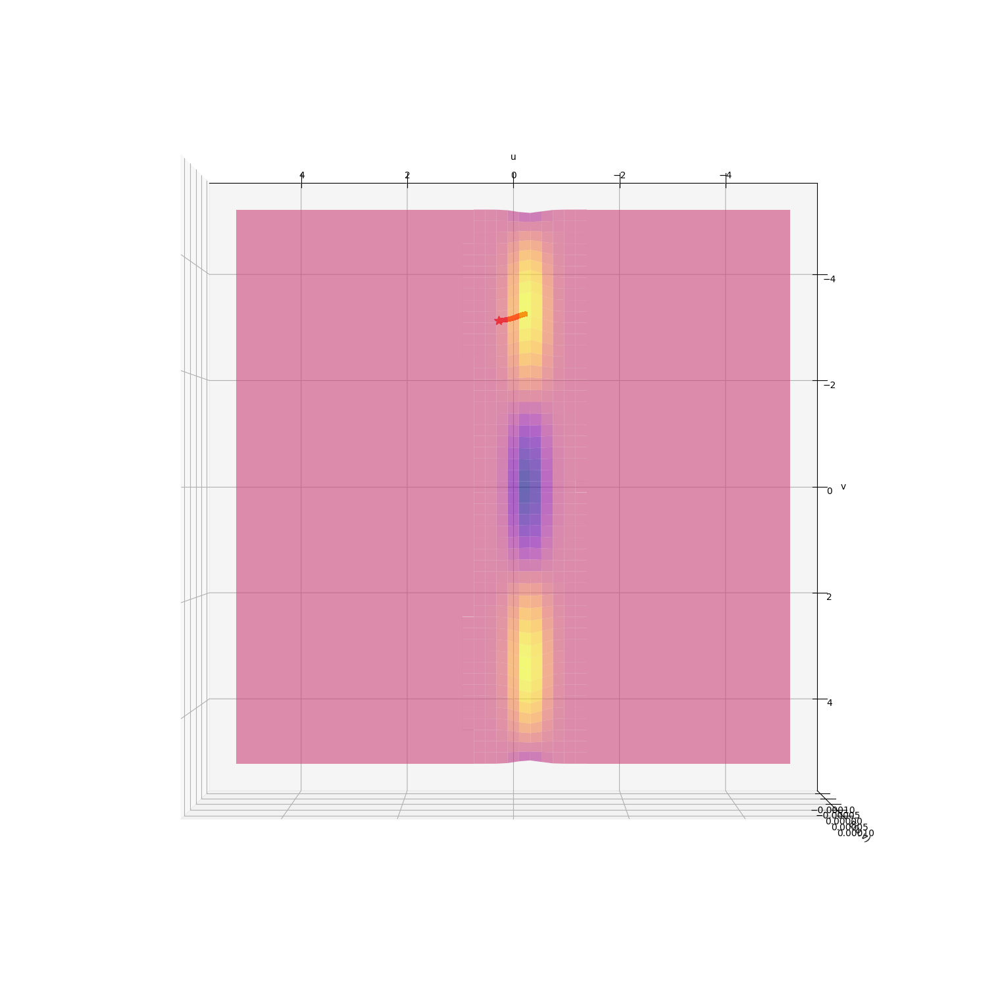

In [33]:
w_c1, k_c1, ws_c1, val1  = gd_mod(coord2, eta1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord2,' ---')
print('Learning rate ',eta1)
print('Coordinates obtained: (', w_c1[0], ', ', w_c1[1],')')
print('Value achieved:', E(w_c1))
display_figure(5, E, ws_c1, [45,30], 'plasma','')
display_figure(5, E, ws_c1, [90,90], 'plasma','')


Graph that compares the value of the function in each iteration of the second point using η=0.1 and η=0.01


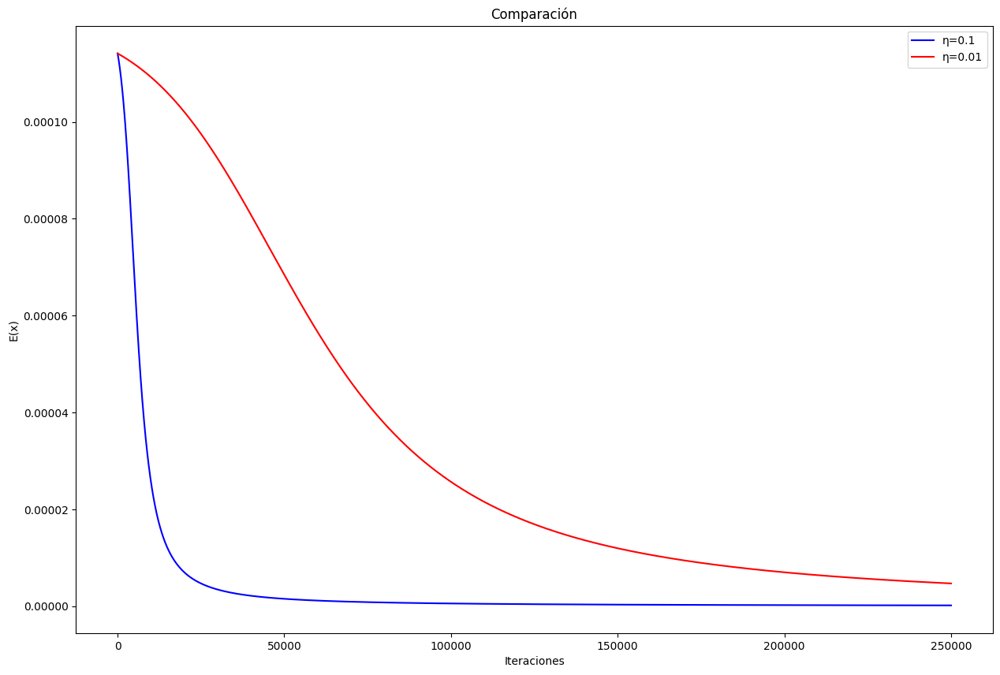

In [34]:
arr_val0 = np.array(val0)
arr_val1 = np.array(val1)
ta = []                         # Auxiliary array for labels
ta.append('η='+str(eta0))       #η = 0.1
ta.append('η='+str(eta1))        #η = 0.01
arr_ta = np.array(ta)
display_figure_compare2D(arr_val0,arr_val1,arr_ta,'blue','red','Iterations','E(x)','Comparison')


It can be seen that when using η = 0.01 the descent is much slower in each iteration, falling short of reaching the value obtained when using η = 0.1. By using η = 0.1 it is lowered more quickly but for many iterations it remains constant without reaching the local optimum.


###### Coordenada: [0.4,0.0] 


* Se utiliza un η = 0.1


--- Coordenada inicial  [0.4 0. ]  ---
Learning rate  0.1
Coordinates obtained: ( -0.2759971580994142 ,  0.07883477808770467 )
Valor alcanzado:  -0.00012277703791255387


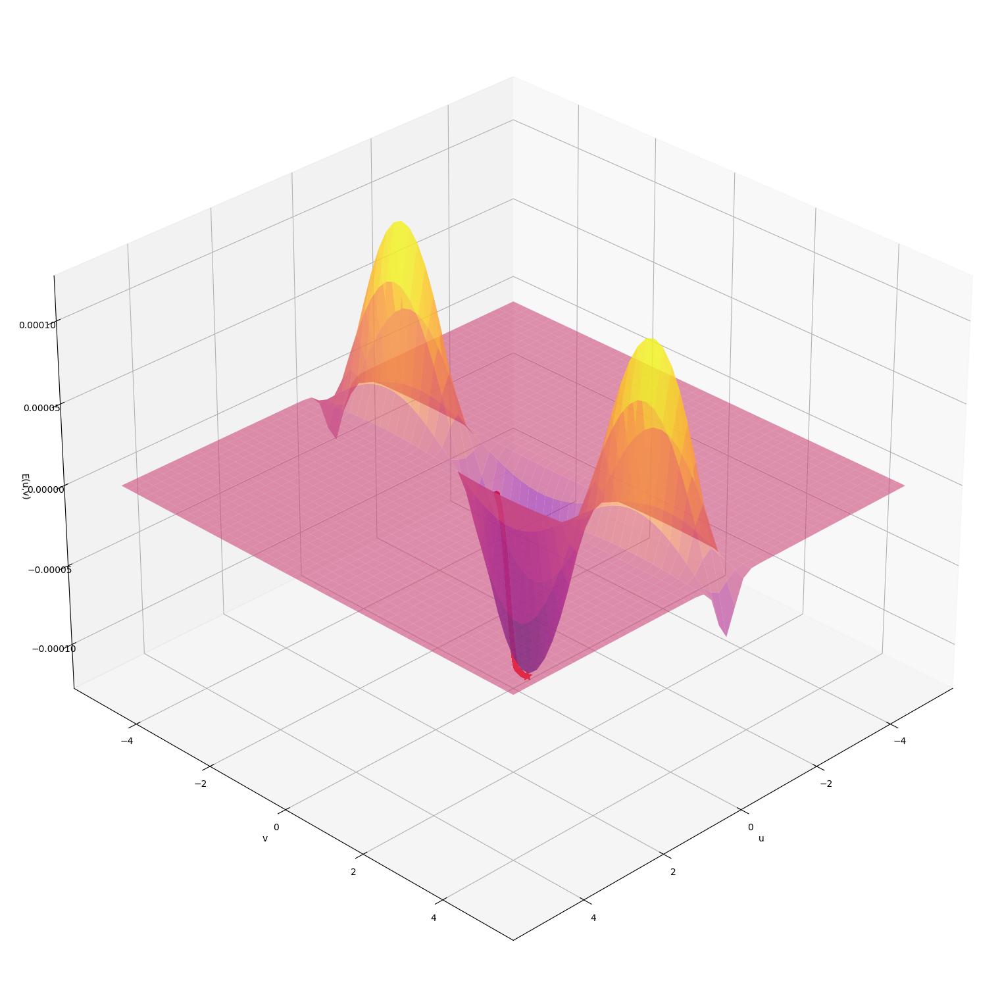

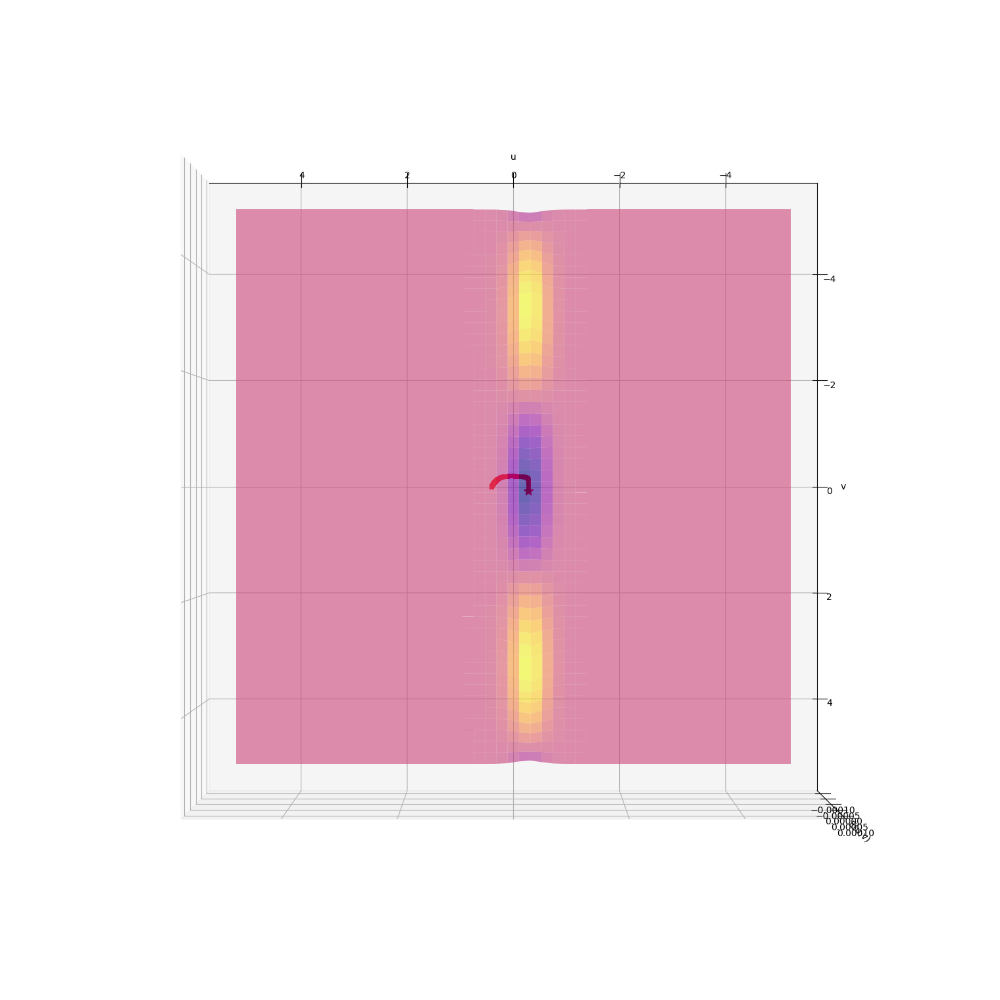

In [35]:
w_c0, k_c0, ws_c0, val0  = gd_mod(coord3, eta0, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord3,' ---')
print('Learning rate ',eta0)
print('Coordinates obtained: (', w_c0[0], ', ', w_c0[1],')')
print('Value achieved:', E(w_c0))
display_figure(5, E, ws_c0, [45,30], 'plasma','')
display_figure(5, E, ws_c0, [90,90], 'plasma','')


* Se utiliza un η = 0.01


--- Coordenada inicial  [0.4 0. ]  ---
Learning rate  0.01
Coordinates obtained: ( 0.36774585463445275 ,  -0.05715403467006244 )
Valor alcanzado:  -1.0990914327715056e-06


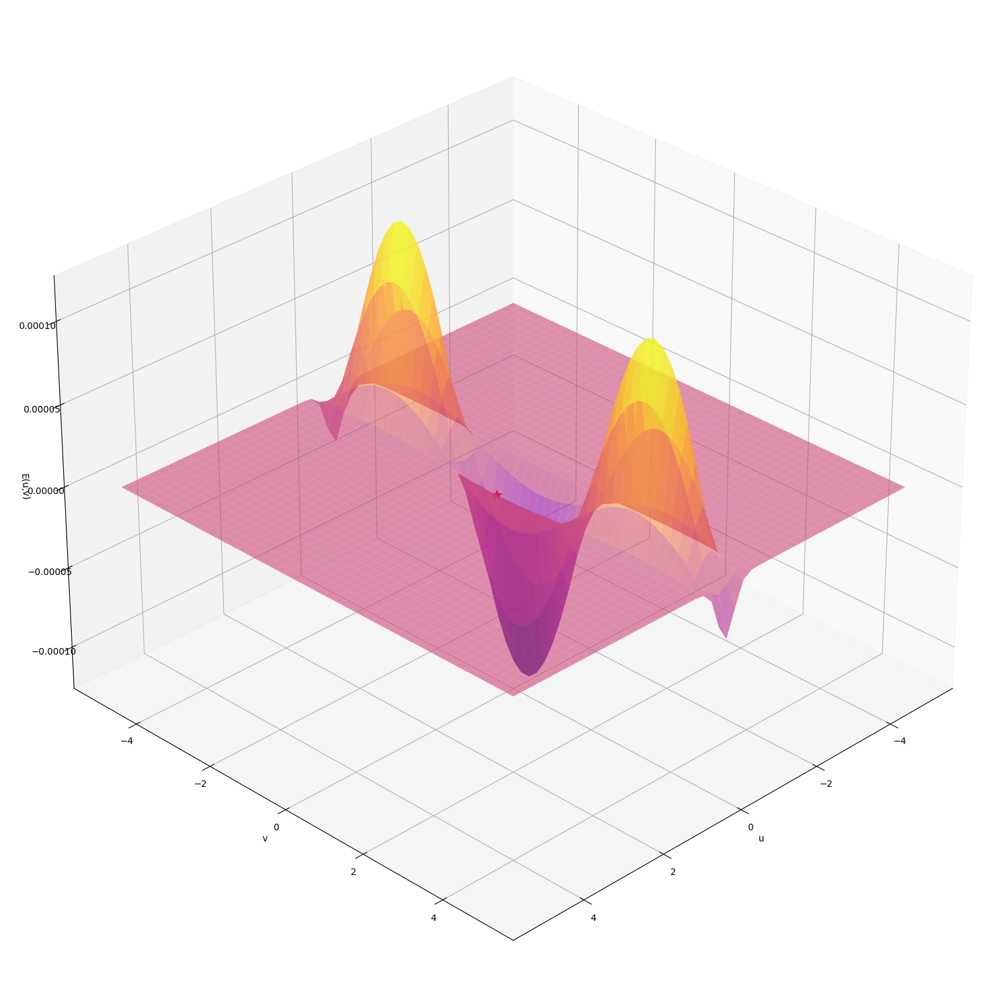

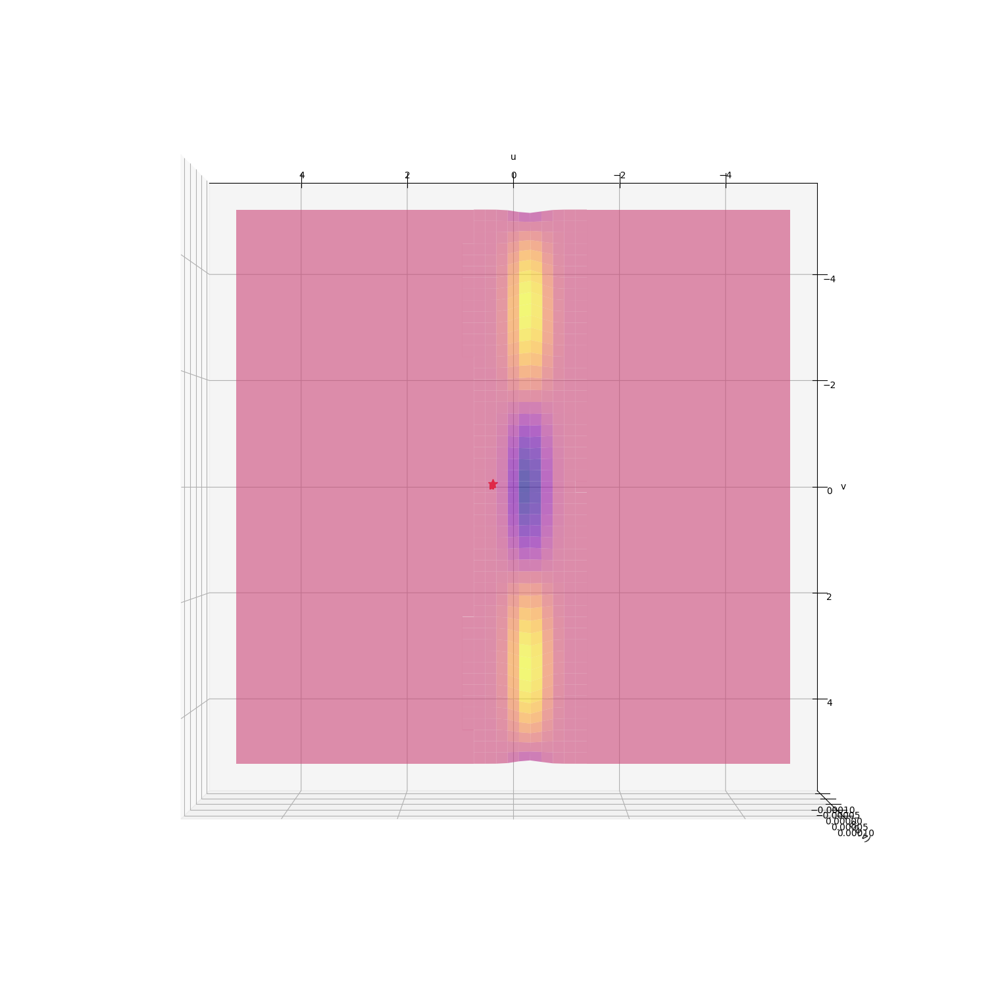

In [36]:
w_c1, k_c1, ws_c1, val1  = gd_mod(coord3, eta1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord3,' ---')
print('Learning rate ',eta1)
print('Coordinates obtained: (', w_c1[0], ', ', w_c1[1],')')
print('Value achieved:', E(w_c1))
display_figure(5, E, ws_c1, [45,30], 'plasma','')
display_figure(5, E, ws_c1, [90,90], 'plasma','')


Graph that compares the value of the function in each iteration of the third point using η=0.1 and η=0.01


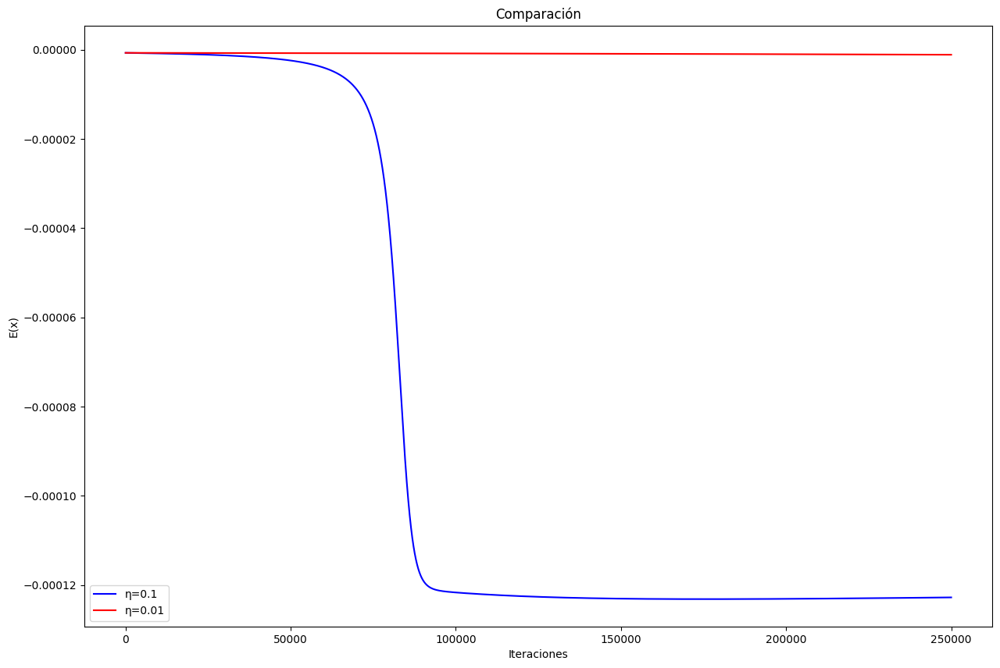

In [37]:
arr_val0 = np.array(val0)
arr_val1 = np.array(val1)
ta = []                         # Auxiliary array for labels
ta.append('η='+str(eta0))       #η = 0.1
ta.append('η='+str(eta1))        #η = 0.01
arr_ta = np.array(ta)
display_figure_compare2D(arr_val0,arr_val1,arr_ta,'blue','red','Iterations','E(x)','Comparison')


In this case you can see the big difference that exists when using one learning rate or another. When using η = 0.01 the descent is very long, so long that it appears constant on the graph. On the other hand, by using η = 0.1, convergence is achieved, obtaining the lowest value found, which is negative.


###### Coordenada: [-0.25,-2.0] 


* Se utiliza un η = 0.1


--- Coordenada inicial  [-0.25 -2.  ]  ---
Learning rate  0.1
Coordinates obtained: ( 0.4125723452888333 ,  -2.0 )
Valor alcanzado:  2.320279603368178e-07


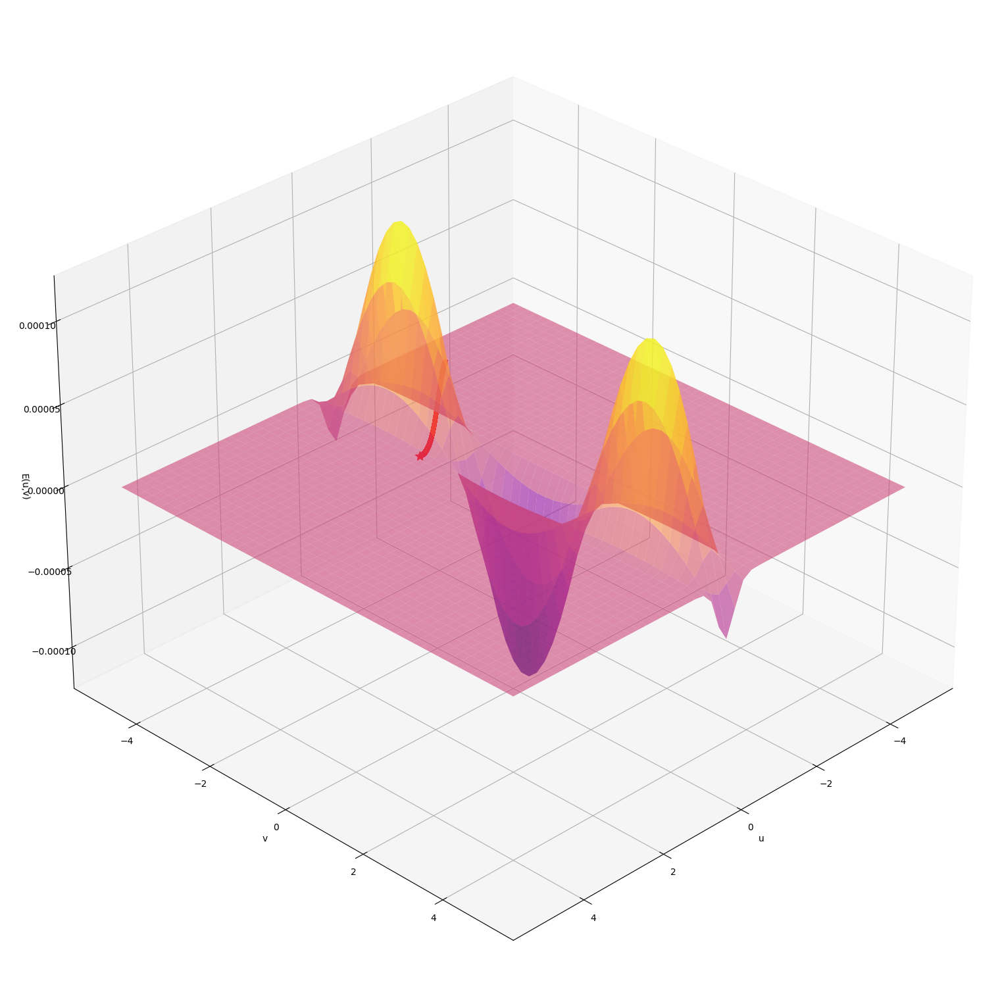

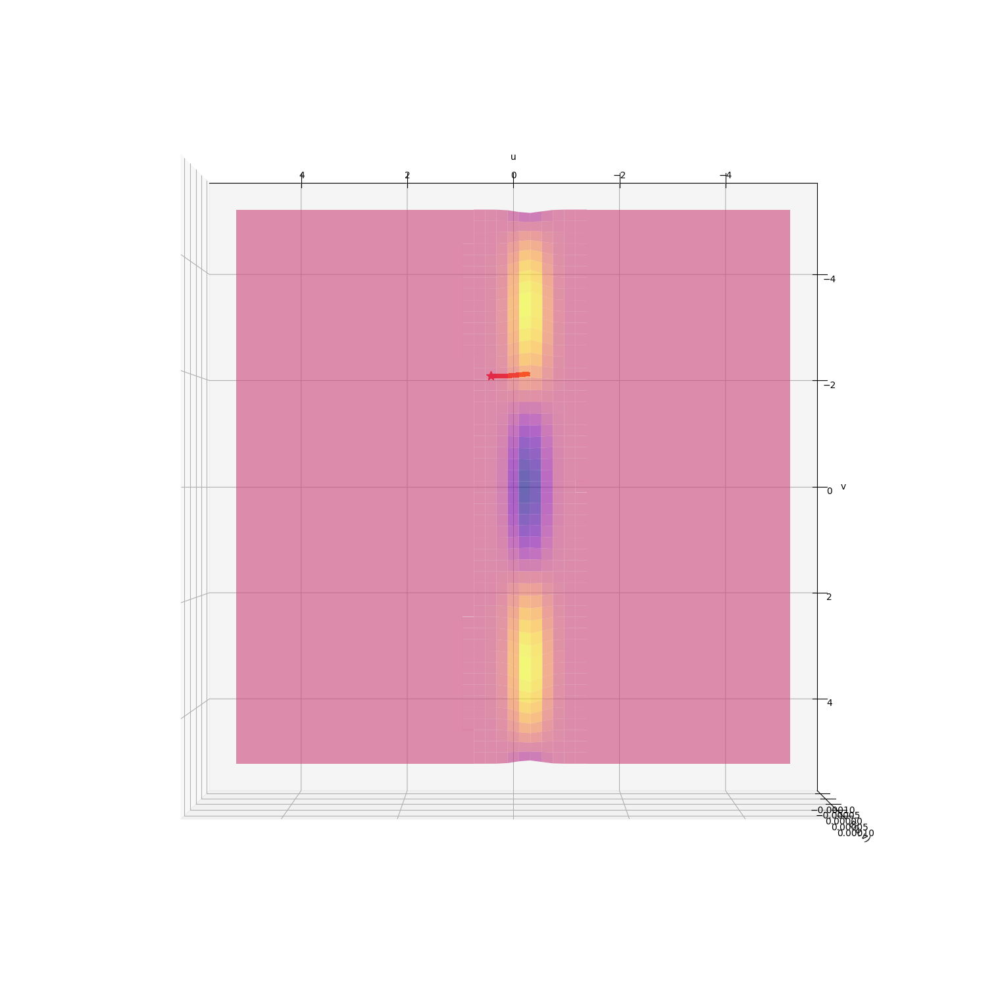

In [38]:
w_c0, k_c0, ws_c0, val0  = gd_mod(coord4, eta0, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord4,' ---')
print('Learning rate ',eta0)
print('Coordinates obtained: (', w_c0[0], ', ', w_c0[1],')')
print('Value achieved:', E(w_c0))
display_figure(5, E, ws_c0, [45,30], 'plasma','')
display_figure(5, E, ws_c0, [90,90], 'plasma','')


* Se utiliza un η = 0.01


--- Coordenada inicial  [-0.25 -2.  ]  ---
Learning rate  0.01
Coordinates obtained: ( 0.0013775809984272352 ,  -2.0 )
Valor alcanzado:  2.1338477004629387e-05


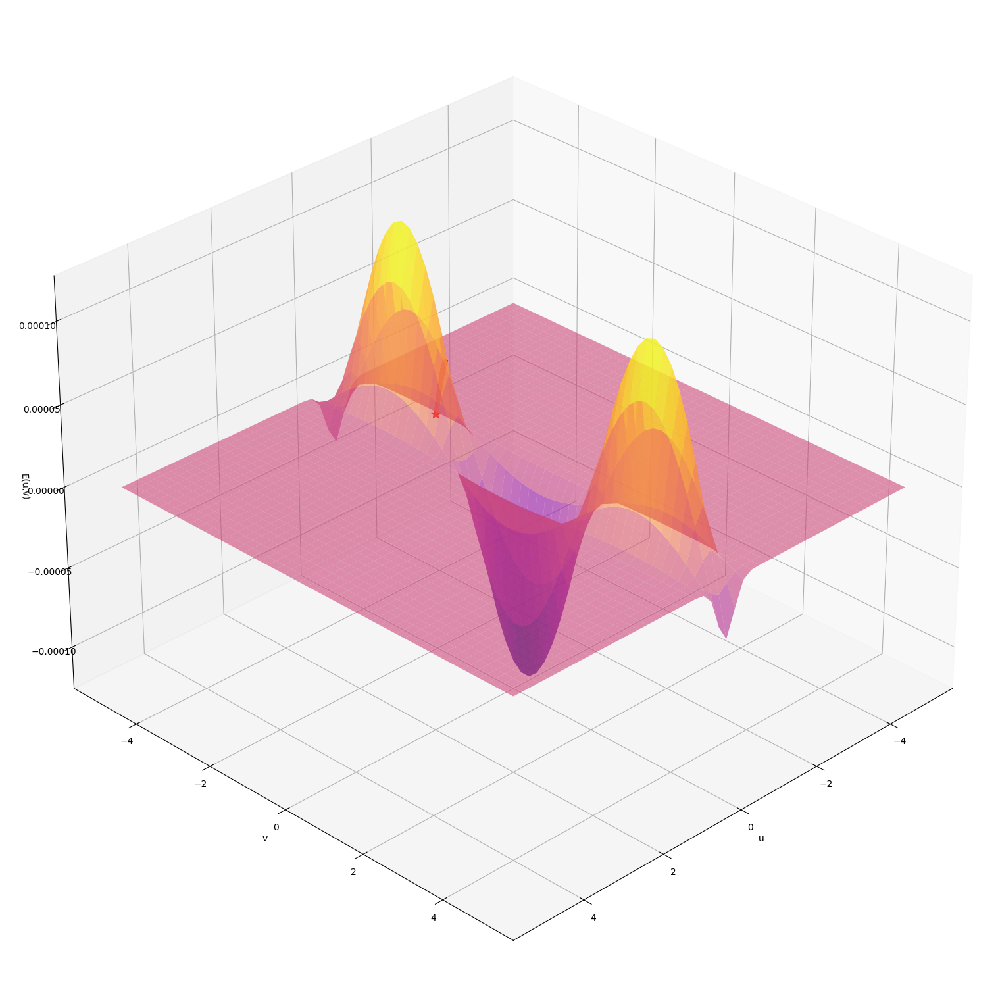

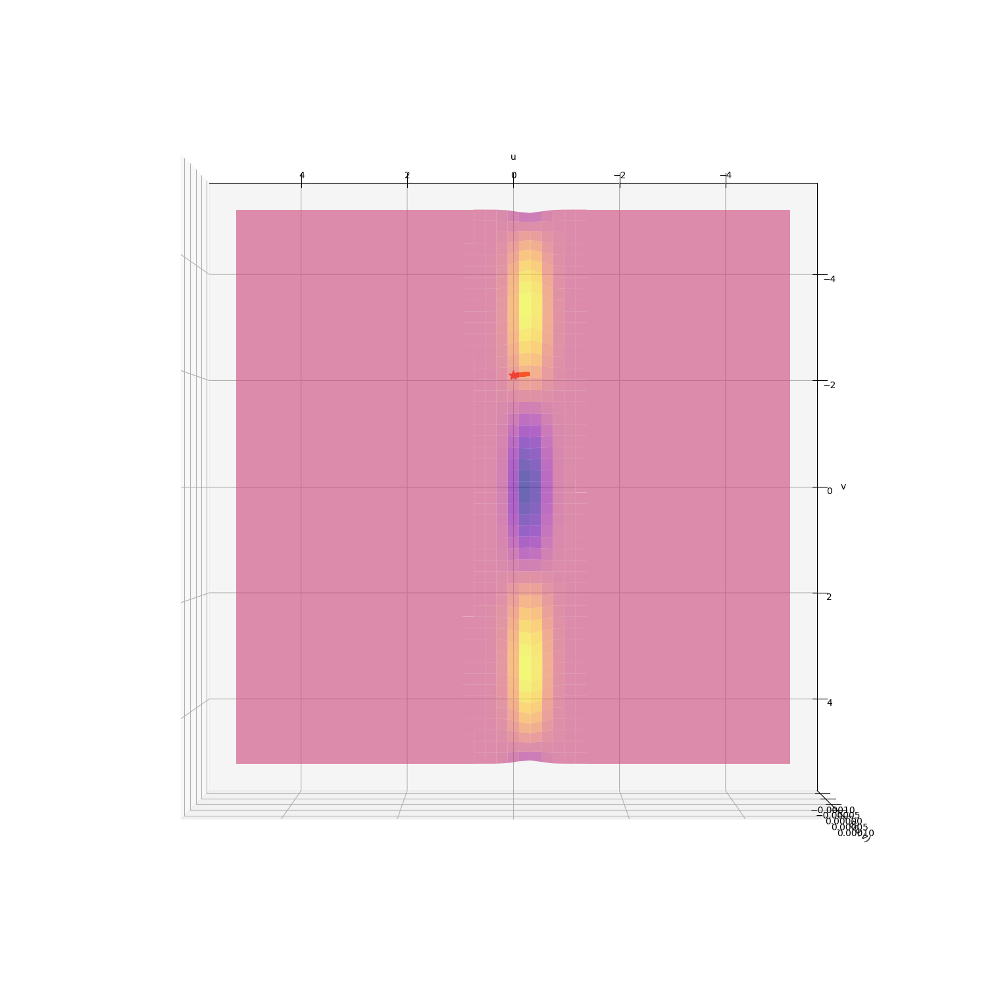

In [39]:
w_c1, k_c1, ws_c1, val1  = gd_mod(coord4, eta1, gradE, E, float('-inf'), max_iters=250000, show_evol = False)
print('--- Coordenada inicial ',coord4,' ---')
print('Learning rate ',eta1)
print('Coordinates obtained: (', w_c1[0], ', ', w_c1[1],')')
print('Value achieved:', E(w_c1))
display_figure(5, E, ws_c1, [45,30], 'plasma','')
display_figure(5, E, ws_c1, [90,90], 'plasma','')


Graph that compares the value of the function in each iteration of the fourth point using η=0.1 and η=0.01


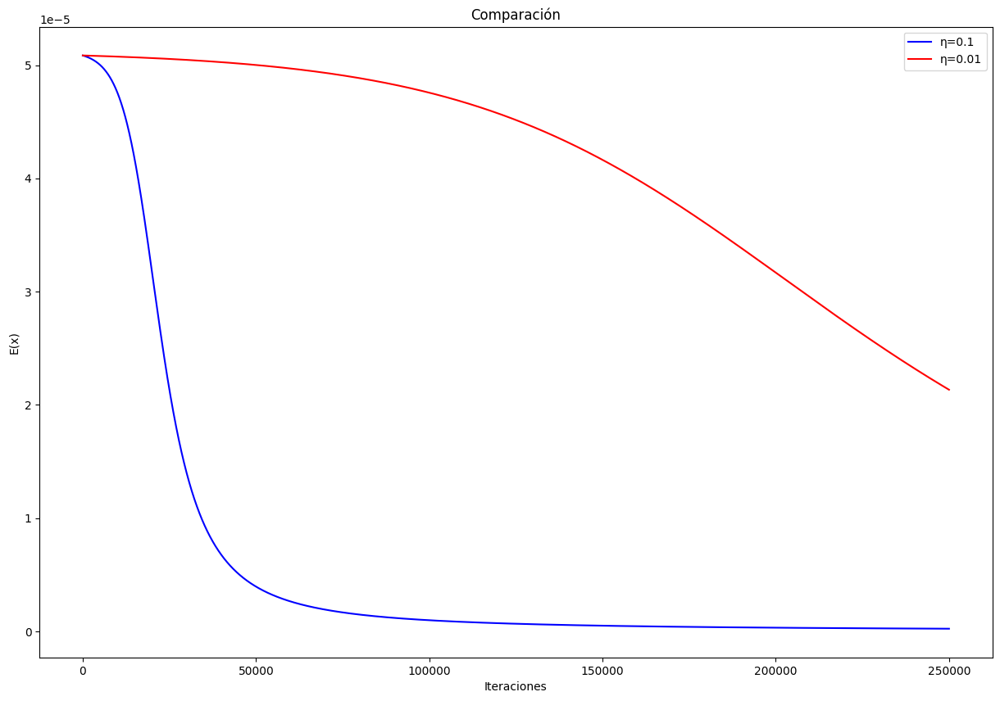

In [40]:
arr_val0 = np.array(val0)
arr_val1 = np.array(val1)
ta = []                         # Auxiliary array for labels
ta.append('η='+str(eta0))       #η = 0.1
ta.append('η='+str(eta1))        #η = 0.01
arr_ta = np.array(ta)
display_figure_compare2D(arr_val0,arr_val1,arr_ta,'blue','red','Iterations','E(x)','Comparison')


In this case it can be observed, like the second point, that with a small η more iterations are needed to converge, falling short. Using η = 0.1 it is possible to converge, but it does not find the lowest point of the function due to its initial coordinates, something that the third point managed to get closer to.


### <font color='blue'>(1 point) What would be your conclusion about the true difficulty of finding the global minimum of an arbitrary function?</font>


After all the previous experiments using the GD algorithm, they imply that the algorithm depends on the initial coordinates (Wo) and the learning rate (η) to find the optimal one.

The complexity of the function must be taken into account to choose the above parameters well.

It is important to have these considerations because having a short distance from wo to the optimum, if η is very large it will not stabilize, remaining oscillating around. While with a long
distance from wo to the optimum, if η is very short it will take a long time to reach the optimum, having a great cost.

In conclusion, I think that it would be necessary to choose a Wo and a proportional η, but to do so it would be necessary to study the function before applying the GD algorithm. Therefore, using random values ​​and adapting η may be the best option.


## <font color='blue'>Exercise 2: LINEAR REGRESSION (5.5 points) </font>


### <font color='blue'>(2.5 points) This exercise fits regression models to feature vectors extracted from images of handwritten digits. 

<font color='blue'>In particular, two specific characteristics are extracted that measure the average value of the gray level and the symmetry of the digit with respect to its vertical axis. Only images with numbers $1$ and $5$ will be selected for this exercise. </font>

<font color='blue'>Estimate a linear regression model, based on the data provided by
the given feature vectors, using both the algorithm
of the pseudo-inverse as stochastic gradient descent (SGD). The pseudo-inverse must be calculated by means of the singular value decomposition seen in theory (that is, the function `np.linalg.svd()` must be used). The labels will be
$\{-1,1\}$, one for each of the numbers. The solutions obtained must be drawn
along with the data used in the adjustment (both training and test data). Assess the goodness of the result using $E_{in}$ and
$E_{out}$ (for $E_{out}$ calculate the predictions using the data in the test file). The percentage of correctness in classification must also be included, both for the training and test data. </font>


In [41]:
# Environment: works locally (GitHub/Jupyter) and on Google Colab
import sys
from pathlib import Path

from paths import ROOT, get_data
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

print(f"Project root: {ROOT}")


Mounted at /content/drive


##### Funciones.


In [42]:
# Function to read data
def readData(file_x, file_y, class1, class2, label_class1, label_class2):
    # We read the files
    datax = np.load(file_x)
    datay = np.load(file_y)
    y = []
    x = []    
    # We only save the data of the two classes that interest us
    for i in range(0,datay.size):
        if datay[i] == class1 or datay[i] == class2:
            if datay[i] == class1:
                y.append(label_class1)
            else:
                y.append(label_class2)
            x.append(np.array([1, datax[i][0], datax[i][1]]))
            
    x = np.array(x, np.float64)
    y = np.array(y, np.float64)
    
    return x, y


In [43]:
# Function to calculate the error
def MSE(x,y,w):
    return (1/y.size)*np.linalg.norm(x.dot(w)-y)**2


In [44]:
# Calculation of the MSE gradient
# w = the weights
# x = the feature vectors of the minibatch
# y = the minibatch label vector
def gradMSE(w,x,y):
  sum = np.sum( (x.T*(np.dot(x, w)-y)).T,axis=0)
  sum = sum * (2/np.shape(x)[0])  
  return sum


This function returns the accuracy. It is given by counting the number of correct predictions and dividing it by the total number of the sample.


In [81]:
def Acc(muestra, y, w):
  
  test_aciertos_1=0
  test_aciertos_menos1=0

  for i in range(0,len(muestra)):

    val_y = w[0]

    for j in range(1,len(muestra[i])):
      val_y += w[j]*muestra[i][j]

    if(val_y > 0):
   
      if( y[i]==1):
        test_aciertos_1=test_aciertos_1+1
  
    elif(val_y<0):
   
      if( y[i] ==-1):
        test_aciertos_menos1=test_aciertos_menos1+1


  total = test_aciertos_1 + test_aciertos_menos1
  total = total / len(y) * 100


  return total


##### Data to use.


In [46]:
class1 = 5 # digit 5
class2 = 1 # digit 1

label1 = 1 # label used to represent class1
label2 = -1 # label used to represent class2

# Reading training data
x, y = readData(get_data('X_train.npy'), 
                get_data('y_train.npy'), class1, class2, label1, label2)
# Reading data for the test
x_test, y_test = readData(get_data('X_test.npy'), 
                          get_data('y_test.npy'), class1, class2, label1, label2)


##### Explanation of the SGD.


The linear regression will be given using the Stochastic Gradient Descent algorithm.
(SGD), using different pieces of the sample, which must be smaller than the entire sample, to calculate the gradient.

The minibatches that will be used are generated randomly, disordering them.


The general equation can be represented in this way:

wj ≔ wj– (η ∗ 𝛴 𝑥𝑛𝑗 (ℎ(𝑥𝑛) − 𝑦𝑛) )

Where w is updated continuously, but using a mini_batch which is the sample chunk already named, 𝛴n∈mini_batch.


##### Implementation of the SGD.


For the implementation of this algorithm, minibatches have been taken into account. Therefore, a vector of indices with the sample size has been created. Two integers that will indicate which part of the vector to use, taking the number of indices that indicate the size of the minibatch (*size_minibatch*). This reduced data is fed into the gradient to update the w. 

As when going through the vector of indices the last data may not be enough, there is an if that limits them so as not to go beyond the vector. 

When traversing the vector of indices completely, it is rearranged again to maintain randomness and the integers return to their initial values.

This time the loop does not take into account any *epsilon* to overcome, but it directly iterates as many times as indicated.


In [47]:
# Stochastic Descent Gradient
np.random.seed(1)
def sgd(x, y, lr, max_iters, tam_minibatch, show_evol = False):
    ind = np.arange(0,len(x))
    np.random.shuffle(ind)

    iters = 0
    batch_inicial = 0
    batch_final = tam_minibatch
    w = np.zeros((x[0,:].size,), dtype=float)
    
    while(iters < max_iters):
        
        mini_batch = ind[batch_inicial:batch_final]
        x_batch = x[mini_batch] 
        y_batch = y[mini_batch]
    
        w = w - lr*gradMSE(w,x_batch,y_batch)
        
        batch_inicial += tam_minibatch
        batch_final += tam_minibatch
        
        # Reboot when going out of range
        if (batch_final >= len(x)):
            batch_final = len(x)
        
        if (batch_inicial >= len(x)):
            batch_inicial = 0
            batch_final = tam_minibatch
            np.random.shuffle(ind)
        
        
        iters += 1


       
    return w



##### sgd experimentation


The algorithm is applied to the train data.


In [48]:
w = sgd(x,y,0.01,260, 32)


The result is displayed and compared with the result of applying the weights obtained to the train data in test.


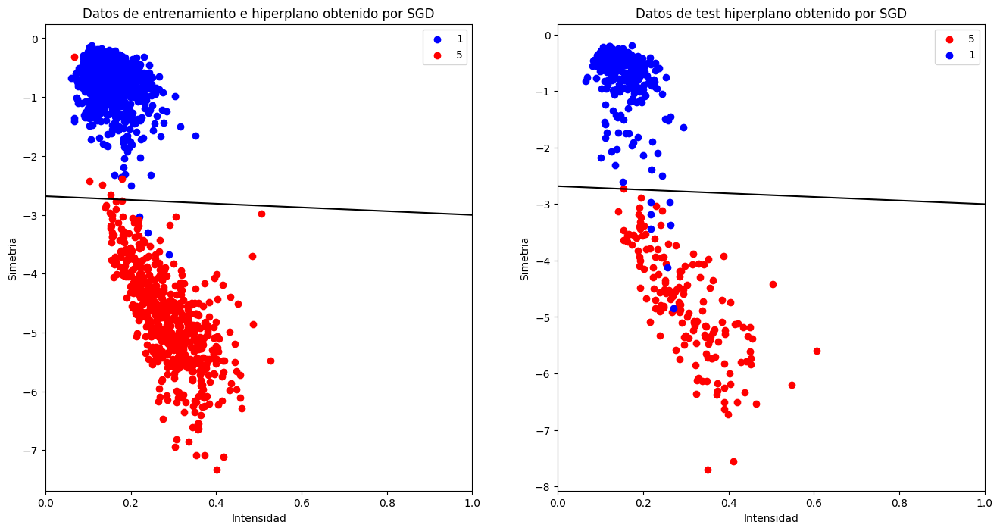

In [49]:
# I create some figures
fig = plt.figure(figsize=(16,8))
label5 = 1
label1 = -1

leyenda5 = '5'
leyenda1 = '1'

'''TRAINING DATA'''
ax = fig.add_subplot(1, 2, 1)
ax.set_title('Training data and hyperplane obtained by SGD')
ax.set_xlabel('Intensidad')
ax.set_ylabel('Simetria')

lab1 = x[y == label5]
lab2 = x[y == label1]

ax.scatter(lab2[:,1],lab2[:,2],c='blue',label= leyenda1)
ax.scatter(lab1[:,1],lab1[:,2],c='red',label= leyenda5)


ax.plot([0, 1] , [ -w[0] / w[2] , -w[0] / w[2] - w[1] / w[2] ],'k')
plt.xlim([0, 1])
ax.legend()

'''TEST DATA'''

w_test = sgd(x_test,y_test,0.01,200, 32)

ax = fig.add_subplot(1, 2, 2)
ax.set_title('Hyperplane test data obtained by SGD')
ax.set_xlabel('Intensidad')
ax.set_ylabel('Simetria')

lab1_test = x_test[y_test == label5]
lab2_test = x_test[y_test == label1]

ax.scatter(lab1_test[:,1],lab1_test[:,2],c='red',label= leyenda5)
ax.scatter(lab2_test[:,1],lab2_test[:,2],c='blue',label= leyenda1)

ax.plot([0, 1],[ -w[0] / w[2]  , -w[0] / w[2] - w[1] / w[2] ],'k')
plt.xlim([0, 1])

ax.legend()
plt.show()


In [50]:

print ('\nGoodness of fit:\n')
print ("Ein: ", MSE(x,y,w))
print ("Eout: ", MSE(x_test, y_test, w))
print("Acc on train:", Acc(x,y,w))
print("Acc on test:", Acc(x_test,y_test,w))



Goodness of fit:

Ein:  0.08950409222703536
Eout:  0.13858988092459174
Acc en train:  99.48750800768738
Acc en test:  98.11320754716981


The Mean Square Error (MSE) helps us measure the accuracy of a regression model. The lower the value of this, the more accurate the model is when predicting.


In this case, the MSE of the train data with the weights obtained measures the ability to fit the data. While the MSE on the test data is applied to see the ability of the generated model to generalize with new data external to its training stage.


Accuracy has been used to see the number of well-classified samples among the number of total samples.

It can be seen that in this case very good results are obtained in the accuracy of the train data, getting very close to the perfect classification, so it has fitted the data well. The accuracy of the test data is also very high, so the model has managed to classify a model external to the sample but of a similar nature very well.


##### Pseudoinverse Explanation


The pseudoinverse is considered a method that gives us the linear equation of the line that classifies the data set based on $y = w_0 + w_1x_1 + w_2x_2$. Being $w_0$ the Bias, $w_1x_1$ the Average Intensity and $w_2x_2$ the Symmetry. This method does not need iterations or any learning rate but by having to calculate $(X^tX)^{-1}$ it can be more expensive than SGD.

The pseudo inverse equation is: $X^+ = (X^T*X)^{-1}*X^T$


##### Pseudo-inverse implementation


For the implementation, the pdf of the subject and an email sent by the teacher were used.

* The Singular Value Decomposition (SVD) is obtained. 
* D† is calculated and inverted.
* D is expanded to multiply U_trasp * D_invert. It is extended using *np.linalg.inv()*.
* The pseudo inverse is calculated.
* Weights are calculated.


In [51]:
# Pseudo-inverse algorithm
def pseudoinverse(x, y):

    U,d,VT = np.linalg.svd(x)
   
    D  =  np.diag(d)
    D_invert = np.linalg.inv(D)
 
    n_col=D_invert.shape[1]
    n_fil=U.shape[0]
    n_col_nueva = U.shape[0]
    n_col_originales = D_invert.shape[1]
    n_col_faltantes = n_col_nueva - n_col_originales
    D_mas = np.hstack((D_invert, np.zeros((3, n_col_faltantes))))

    pseudo_inversa = np.dot(VT.T, np.dot(D_mas,U.T))

    w = np.dot(pseudo_inversa, y)

    return w


##### Pseudo-inverse experimentation


In [52]:
class1 = 5 # digit 5
class2 = 1 # digit 1
label1 = 1 # label used to represent class1
label2 = -1 # label used to represent class2
# Reading training data
x_train, y_train = readData(get_data('X_train.npy'), 
                get_data('y_train.npy'), class1, class2, label1, label2)
# Reading data for the test
x_test, y_test = readData(get_data('X_test.npy'), 
                          get_data('y_test.npy'), class1, class2, label1, label2)


In [53]:
w_ps = pseudoinverse(x_train, y_train)


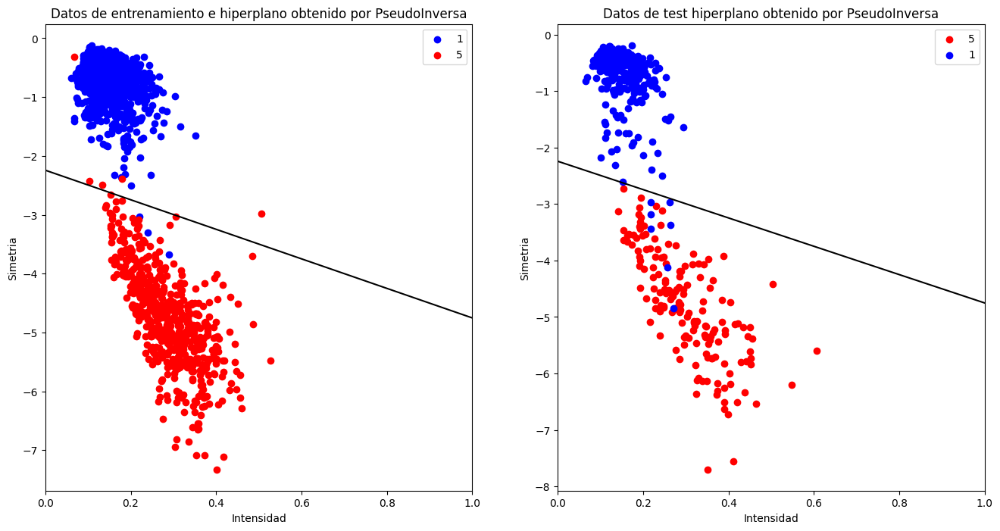

In [54]:
# I create some figures
fig = plt.figure(figsize=(16,8))
label5 = 1
label1 = -1

leyenda5 = '5'
leyenda1 = '1'

'''TRAINING DATA'''
ax = fig.add_subplot(1, 2, 1)
ax.set_title('Training data and hyperplane obtained by PseudoInversa')
ax.set_xlabel('Intensidad')
ax.set_ylabel('Simetria')

lab1 = x_train[y_train == label5]
lab2 = x_train[y_train == label1]

ax.scatter(lab2[:,1],lab2[:,2],c='blue',label= leyenda1)
ax.scatter(lab1[:,1],lab1[:,2],c='red',label= leyenda5)


ax.plot([0, 1] , [ -w_ps[0] / w_ps[2] , -w_ps[0] / w_ps[2] - w_ps[1] / w_ps[2] ],'k')
plt.xlim([0, 1])
ax.legend()

'''TEST DATA'''

w_test = sgd(x_test,y_test,0.01,200, 32)

ax = fig.add_subplot(1, 2, 2)
ax.set_title('Hyperplane test data obtained by PseudoInversa')
ax.set_xlabel('Intensidad')
ax.set_ylabel('Simetria')

lab1_test = x_test[y_test == label5]
lab2_test = x_test[y_test == label1]

ax.scatter(lab1_test[:,1],lab1_test[:,2],c='red',label= leyenda5)
ax.scatter(lab2_test[:,1],lab2_test[:,2],c='blue',label= leyenda1)

ax.plot([0, 1],[ -w_ps[0] / w_ps[2]  , -w_ps[0] / w_ps[2] - w_ps[1] / w_ps[2] ],'k')
plt.xlim([0, 1])

ax.legend()
plt.show()


In [55]:
print ('\nGoodness of the result for the pseudoinverse algorithm:\n')
print ("Ein: ", MSE(x_train,y_train,w_ps))
print ("Eout: ", MSE(x_test, y_test, w_ps))
print("Acc on train:", Acc(x_train,y_train,w_ps))
print("Acc on test:", Acc(x_test,y_test,w_ps))



Goodness of fit for the result para el algoritmo de la pseudoinversa:

Ein:  0.07918658628900395
Eout:  0.1309538372005258
Acc en train:  99.48750800768738
Acc en test:  98.34905660377359


The graphs obtained are quite different from those obtained with the SGD, but they still obtain an equally good result, having a very high accuracy in both cases. The MSE in the test and train data are lower than in SGD, so it could mean better accuracy but since the difference is so small you might not even notice the difference.


##### <font color='blue'>What are the advantages and disadvantages of using pseudoinverse with respect to gradient descent and vice versa?</font>


After experimenting with the two algorithms, it has been found that they perform their function well.

The two algorithms have achieved very high and similar accuracy. Although, in terms of MSE the pseudoinverse has less value, so it adapts better to the train sample and for similar problems it may have a greater ability to generalize with new data external to its training stage.

The use of the pseudoinverse is quite practical since you do not need to be careful with parameters such as the initial point and the learning rate. However, the use of pseudoinverse directly treats the data, so if they are large in size it may require a large computational load.

To conclude in view of the data, on some occasions with small data the pseudo inverse will perform well at an acceptable computational cost, while on other occasions the SGD is a good option taking into account the requirements that must be taken.


### <font color='blue'>(3 points) In this section we explore how the $E_{in}$ and $E_{out}$ errors transform when we increase the complexity of the linear model used. 
Now we make use of the $simula\_unif(N, 2, size)$ function that returns $N$ 2D coordinates of points uniformly sampled within the square defined by $[-size, size] \times [-size, size]$. The following experiment should be performed:</font>


##### Funciones


In [56]:
# Simulates data in a square [-size,size]x[-size,size]
def simula_unif(N, d, size):
    return np.random.uniform(-size,size,(N,d))


Auxiliary rendering functions


This function displays the sample by labeling them with the *color* parameter.


In [57]:
def display_figure2D_muestra(muestra,color,title):
    fig = plt.figure()
    ax = fig.add_subplot()
    
    ax.scatter(muestra[:, 0], muestra[:, 1],c=color)
    ax.set_title(title)


This function represents the sample and its labels, but it also represents the linear regression line. This is represented using $y = (-w_0 - w_1x)/w_2$, which comes from the equation of the line $Ax + By + C = 0$


In [58]:
def display_figure2D_2Fig(muestras, labels, w, w_color, title):
    fig = plt.figure()
    ax = fig.add_subplot()
    
    ax.scatter(muestras[:,1], muestras[:,2], c = labels)
    
    ax.set_ylim(-1.0, 1.0)
    ax.set_xlim(-1.0, 1.0)
    
    X = np.linspace(-1, 1)
    Y = (- w[0] - w[1] * X) / w[2]
    
    ax.plot(X, Y, c = w_color)
    ax.set_title(title)


##### <font color='blue'>a) Generate a training sample of $N = 1000$ points in the square
$\mathcal{X} =[-1, 1] \times [-1, 1]$. Paint the 2D point map.</font>


Sample N = 1000, cuadrado [-1,1]x[-1,1]


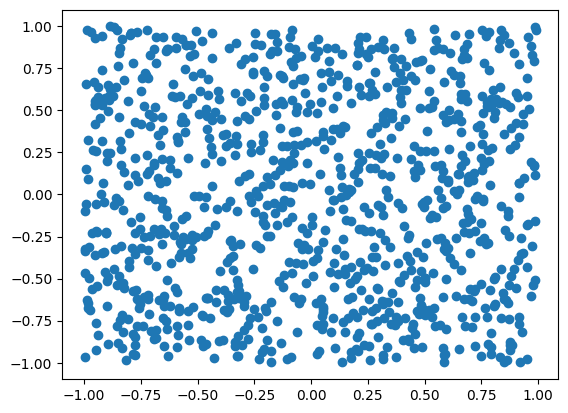

In [59]:
muestra = simula_unif(1000,2,1)
display_figure2D_muestra(muestra, None, None)
print('Sample N = 1000, square [-1,1]x[-1,1]')


##### <font color='blue'>b) Let's consider the function $f(x_1, x_2) = sign((x_1 - 0.2)^2 + x^2_2 - 0.6)$ that we will use to assign a label to each point in the sample above. We introduce
noise on the labels by changing the sign of 10\% of them chosen randomly. Paint the obtained label map. </font>


###### Funciones etiquetado


The *generate_labels* function labels the sample using the defined functions, labeling them as 1 or -1.


In [60]:
# b) We use the function f2 to assign labels to sample x and enter
# noise at 10% of them

# Sign function
def sign(x):
    if x >= 0:
        return 1
    return -1

def f(x1, x2):
    return sign((x1-0.2)**2+x2**2-0.6) 


def generate_labels(muestra):
    labels = np.empty(len(muestra))

    for i in range(0, len(labels)):
        labels[i] = f(muestra[i][0], muestra[i][1])
    
    return labels


This function adds a percentage of noise to the labeling. Add a percentage of noise to one class, and the same to the other. 

Noise can be defined in this case as changing the value of the data.


In [61]:
def introducir_ruido(y,porcent_ruido):
  y_copy = y.copy()
  num = int(y.size * porcent_ruido)
  ind = np.random.choice(y.size, num, replace = False)


  ind0 = np.array(np.where(y_copy > 0))
  ind1 = np.array(np.where(y_copy < 0))

  np.random.shuffle(ind0)
  np.random.shuffle(ind1)

  lim0 = int(len(ind0[0]) * porcent_ruido)
  lim1 = int(len(ind1[0]) * porcent_ruido)

  for i in range(0,lim0):
     y_copy[ind0[0][i]] = -y_copy[ind0[0][i]]
  
  for i in range(0,lim1):
    y_copy[ind1[0][i]] = -y_copy[ind1[0][i]]

  return y_copy


###### Resultados


A fully labeled sample is displayed without any noise.


Sample N = 1000, cuadrado [-1,1]x[-1,1]
with labels and no label noise de las etiquetas


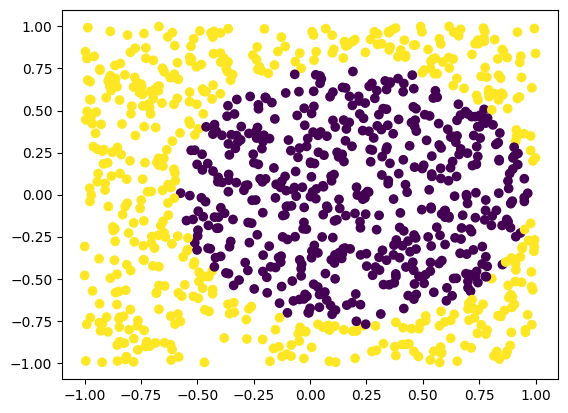

In [62]:
muestra = simula_unif(1000,2,1)
y = generate_labels(muestra)

print ('Sample N = 1000, square [-1,1]x[-1,1]')
print ('with labels and without label noise')

plt.figure()
plt.scatter(muestra[:,0],muestra[:,1], c=y)
plt.show()


The noise is added, in our case 10%, and the sample is displayed.


Sample N = 1000, cuadrado [-1,1]x[-1,1]
with labels and noise en el 10% de las etiquetas


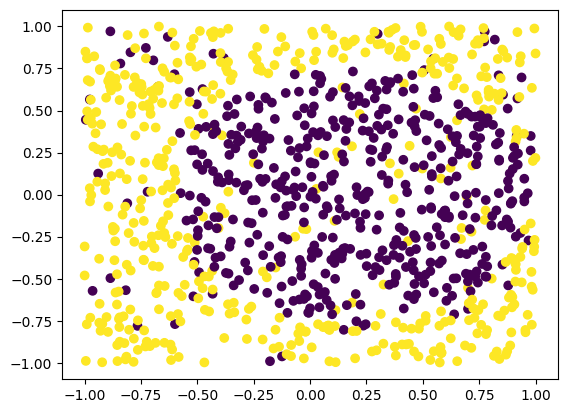

In [63]:
y_noise = introducir_ruido(y,0.1)

print ('Sample N = 1000, square [-1,1]x[-1,1]')
print ('with labels and noise in 10% of labels')

plt.figure()
plt.scatter(muestra[:,0],muestra[:,1], c=y_noise)
plt.show()


##### <font color='blue'>c) Using $(1, x_1, x_2)$ as a feature vector, fit a regression model
linear to the generated data set and estimate the $w$ weights. Estimate the error of
fit $E_{in}$ and the percentage of correct classification using SGD.</font>


###### Funciones auxiliares


This function transforms the sample in such a way that it adapts to the requested characteristics, in this case a column is added to the beginning of the matrix.


In [64]:
def transform_muestraC(muestra):
    muestra_c = np.array([np.ones(int(muestra.size / 2)), muestra[:, 0], muestra[:, 1]])
    
    return muestra_c.transpose()


###### Resultados


In this section the previous sample and the labels that have 10% noise are used.

* The sample is transformed to the indicated format
* The sgd is calculated using a 0.01 learning rate, 250 iterations and 32 minibatch.
* The sample obtained is displayed with its regression line.


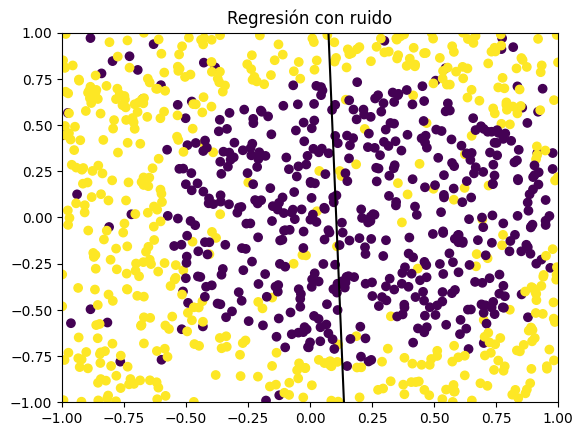

In [65]:
# c) Linear regression model, estimate Ein with SGD

muestrac = transform_muestraC(muestra)

w_c = sgd(muestrac,y_noise,0.01 , 250, 32)

display_figure2D_2Fig(muestrac,y_noise, w_c ,'k' ,'Regresión con ruido')


In [66]:
print("\nGoodness of the result for the regression:")
print("\nEin : ", MSE(muestrac, y_noise, w_c))
print("\nAccuracity",Acc(muestrac,y_noise,w_c))



Goodness of fit for the result para la regresion:

Ein :  0.9435144184977181

Accuracity 57.699999999999996


It can be seen that it has a high Ein, having an approximate accuracy of 57%, so this model does not adapt well to the characteristics of the problem. 

Furthermore, the representation is not very accurate as it is unable to adapt to the sample.

Perhaps for this problem it is better to look for alternatives before using linear regression.


##### <font color='blue'>d) Run the entire experiment defined by (a)-(c) 1000 times (we generate 1000 different samples) and
- <font color='blue'>Calculate the average value of the $E_{in}$ errors of the 1000 samples.</font>

- <font color='blue'>Generate 1000 new points for each iteration and calculate the value with them
of $E_{out}$ in said iteration. Calculate the mean value of $E_{out}$ across all
iterations.</font>


This experiment iterates 1000 times performing an experiment.

The experiment consists of:
* Create a sample, label it, add noise and adapt it.
* Obtain the weights using SGD, in this case I use 250 iterations, with a size of 32 for the batches and 0.01 learning rate.
* Create a sample to test, label it, add noise and adapt it.

After this, the MSE of each sample and its accuracy are stored to finally obtain an average.


In [67]:
# d) Run the experiment 1000 times
# Initial data
num_iteraciones = 1000                          # Number of maximum iterations
ed_in_medio = np.empty(num_iteraciones)         # Error Array
ed_out_medio = np.empty(num_iteraciones)

acc_in_medio = np.empty(num_iteraciones)
acc_out_medio = np.empty(num_iteraciones)

for i in range(0, num_iteraciones):
    
    # Sample in

    muestra_d = simula_unif(1000,2,1)

    labels_in = generate_labels(muestra_d)
    labels_in_noise = introducir_ruido(labels_in,0.1)
    
    muestra_d_t = transform_muestraC(muestra_d)
    
    # Show out

    muestra_d2 = simula_unif(1000,2,1)
    
    labels_out = generate_labels(muestra_d2)
    labels_out_noise = introducir_ruido(labels_out,0.1)
    
    muestra_d2_t = transform_muestraC(muestra_d2)

    # Regression
    w_d = sgd(muestra_d_t, labels_in_noise, 0.01, 250, 32)
    
    # Error calculation
    ed_in_medio[i] = MSE(muestra_d_t, labels_in_noise, w_d)
    ed_out_medio[i] = MSE(muestra_d2_t, labels_out_noise, w_d)

    acc_in_medio[i] = Acc(muestra_d_t, labels_in_noise, w_d)
    acc_out_medio[i] = Acc(muestra_d2_t, labels_out_noise, w_d)


In [68]:
print("\nEin  : ", ed_in_medio.mean())
print("Eout : ", ed_out_medio.mean())
print("\nAcc_in  : ", acc_in_medio.mean())
print("Acc_out : ", acc_out_medio.mean())



Ein  :  0.9295444062520466
Eout :  0.9338455078939617

Acc_in  :  59.73089999999999
Acc_out :  59.4892


After seeing these results we can see that since the training and test data are of a similar nature, the model obtained behaves similarly in the two samples. It can be seen that the accuracy is almost the same, confirming that it behaves the same in the two samples, achieving approximately 60%. 

Being an average, these are the values ​​to which the 1000 iterations tend, so the linear regression model is not suitable for this problem since it does not classify the data well, having a high error and a not very high accuracy.


##### <font color='blue'>e) Rate how good you think the fit is with this linear model in view
of the average values obtained from $E_{in}$ and $E_{out}$.</font>


<font color='blue'>Repeat the same experiment above but using non-linear characteristics. now
we will use the following feature vector: $\phi_2(x) = (1, x_1, x_2, x_1x_2, x^2_1, x^2_2)$. Adjust
the new linear regression model and calculate the new weight vector $\hat{w}$. Calculate
the average errors of $E_{in}$ and $E_{out}$.

In view of the results of the average errors $E_{in}$ and $E_{out}$ obtained in the two
experiments, which model do you consider to be the most appropriate? Justify your answer.</font>


###### Funciones auxiliares


This function transforms the sample in such a way that it adapts to the requested non-linear characteristics, in this case a column is added to the beginning of the matrix, multiplied in the 4th column, and squared respectively in the 5th and 6th columns.


In [69]:
def AdaptarMuestraE(muestra):
    muestra_f = np.array([np.ones(int(muestra.size / 2)),
                          muestra[:, 0],
                          muestra[:, 1],
                          muestra[:, 0] * muestra[:, 1],
                          np.power(muestra[:, 0], 2),
                          np.power(muestra[:, 1], 2)])
    
    return muestra_f.transpose()


This function represents the sample and its labels, representing an ellipse using the weights obtained.


In [70]:
def display_figure_ciruclar2(muestras, labels, w, w_color, title):

  x1 = np.arange(-1,1,0.01)
  y1 = np.arange(-1,1,0.01)

  X, Y = np.meshgrid(x1, y1)
  Z = w[0] + w[1]*X + w[2]*Y + w[3]*X*Y + w[4]*(X**2) + w[5]*(Y**2)


  fig, ax = plt.subplots(figsize=(8,6))
  ax.scatter(muestras[:, 1], muestras[:, 2], c=labels)
  ax.axis([-1,1,-1,1])
  figura = ax.contour(X,Y,Z,[0],colors=w_color)
  ax.clabel(figura, inline=1)
  plt.show()  


###### Experiment 1


In this first part of the experiment I use only two samples, one for train and another for test, repeating the previous experiment but only with one iteration in order to graph an individual case.


In [83]:
# ## NOW WE TRY WITH NON-LINEAR CHARACTERISTICS ####

#Train

muestraf = AdaptarMuestraE(muestra)
y = generate_labels(muestra)
y_noise = introducir_ruido(y,0.1)

#Test

muestra_test = simula_unif(1000,2,1)
muestraf_test = AdaptarMuestraE(muestra_test)

y_test = generate_labels(muestra_test)
y_noise_test = introducir_ruido(y_test,0.1)

# Regression

w_e = sgd(muestraf, y_noise, 0.01, 1500, 32)


Representation:


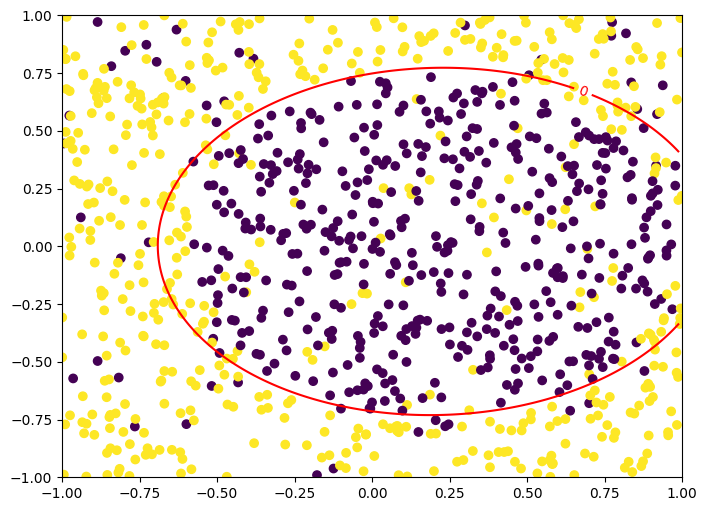

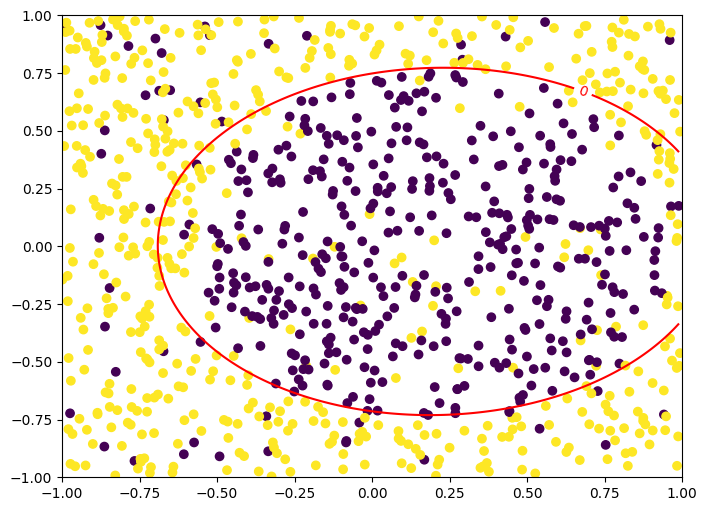

In [84]:
title = 'Regression Train'
title2 = 'Regression Test'

display_figure_ciruclar2(muestraf, y_noise, w_e, 'r', title)
display_figure_ciruclar2(muestraf_test, y_noise_test, w_e, 'r', title2)


In [85]:
print("\nGoodness of the result for the regression:")
print("\nEin : ", MSE(muestraf, y_noise, w_e))
print("\nOut : ", MSE(muestraf_test, y_noise_test, w_e))

print("\nAcc_in  : ", Acc(muestraf, y_noise, w_e))
print("Acc_out : ", Acc(muestraf_test, y_noise_test, w_e))



Goodness of fit for the result para la regresion:

Ein :  0.5914545027602393

Out :  0.6156869056234108

Acc_in  :  85.2
Acc_out :  85.5


It can be seen that this non-linear model classifies the data better, obtaining a much lower error and better accuracy. It can be noted that since the two samples are of the same nature, this nonlinear regression acts in a similar way, obtaining good results. In training the model adjusts to the problem and in testing it makes a similar prediction.


###### Experiment 2


In this experiment we repeat the experiment of 1000 iterations, but using the non-linear characteristics.


In [87]:
num_iteraciones = 1000                          # Number of maximum iterations
ed_in_medioe = np.empty(num_iteraciones)         # Error Array
ed_out_medioe = np.empty(num_iteraciones)

acc_in_medioe = np.empty(num_iteraciones)
acc_out_medioe = np.empty(num_iteraciones)

for i in range(0, num_iteraciones):
    
    # Sample in

    muestra_e = simula_unif(1000,2,1)

    labels_ine = generate_labels(muestra_e)
    labels_ine_noise = introducir_ruido(labels_ine,0.1)
    
    muestra_e_t = AdaptarMuestraE(muestra_e)
    
    # Show out

    muestra_e2 = simula_unif(1000,2,1)
    
    labels_oute = generate_labels(muestra_e2)
    labels_oute_noise = introducir_ruido(labels_oute,0.1)
    
    muestra_e2_t = AdaptarMuestraE(muestra_e2)

    # Regression
    w_e = sgd(muestra_e_t, labels_ine_noise, 0.01, 800, 32)
    
    # Error calculation
    ed_in_medioe[i] = MSE(muestra_e_t, labels_ine_noise, w_e)
    ed_out_medioe[i] = MSE(muestra_e2_t, labels_oute_noise, w_e)

    acc_in_medioe[i] = Acc(muestra_e_t, labels_ine_noise, w_e)
    acc_out_medioe[i] = Acc(muestra_e2_t, labels_oute_noise, w_e)


In [88]:
print("\nEin  : ", ed_in_medioe.mean())
print("Eout : ", ed_out_medioe.mean())
print("\nAcc_in  : ", acc_in_medioe.mean())
print("Acc_out : ", acc_out_medioe.mean())



Ein  :  0.612396412880418
Eout :  0.6182508216008573

Acc_in  :  86.1983
Acc_out :  85.9065


After the thousand iterations you can see where the results tend, which are similar to the previous individual experiment.

As you can see, it has a better accuracy than when linear characteristics were used, so it can be said that for this type of samples the model adapts better. Furthermore, although the MSE is somewhat high, it can be noted that the model works the same in the train and test samples, so for problems of a similar nature it behaves in a similar way. It is not the same to train a model to classify (Example) cats and test it on dogs.


###### Conclusion:


After these experiments we can conclude that for each type of problem there is a model that adapts better than others. In exercise two, linear regression adapted very well to the problem, but in this exercise it has been proven that by using non-linear characteristics, better results have been achieved.

Thanks to this I can understand that before applying any model, visualizing the data will help a lot to make the right choice.
